In [ ]:
# composite per phase:

In [7]:

frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def orient_section(section):
    # Average temperature at the start and end to determine orientation
    n_avg = min(3, len(section['temp']) // 4)
    start_temp = np.nanmean(section['temp'][:n_avg])
    end_temp = np.nanmean(section['temp'][-n_avg:])
    
    flip = False  # Initialize the flip flag

    # Flip the section if the warm side is on the right
    if start_temp > end_temp:
        flip = True
        for key in section:
            section[key] = section[key][::-1]  # Reverse the section

    return section, flip

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    mean = np.nanmean(series)
    std = np.nanstd(series)
    return (series - mean) / std

# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [6, 7, 8,1]
cases = [1]
flip_flags = []  # To store flip flags

for case in cases:

    if case == 1: 
        case_df = frontinfo_df#[frontinfo_df['idx'] ==138328]
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']
        file_path = f'/Volumes/external/TIW/data/saildrone/{year}/1min/TPOS-{year}_SD{sd}_1min.nc'

        try:
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/processed/{year}_SD{sd}.nc')
            section = slice_around_front(data, front_time)
            if len(section['temp']) > 0 and not np.all(np.isnan(section['temp'])):
                section, flip = orient_section(section)  # Get section and flip flag
                sections.append(section)
                flip_flags.append(flip)  # Append flip status
            else:
                print(f"Skipping front {idx}: No valid data.")
        except Exception as e:
            print(f"Failed to process front {idx} in {file_path}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['temp']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}

    # Filter and detrend 'chl' before computing the composite
    smooth_sigma = 1  # Approximate equivalent to a window size of 3
    
    # Filter, detrend, and smooth 'chl' before computing the composite
    for key in padded_sections[0]:
        if key != 'time':
            if key == 'chl': 
                chl = np.array([sec[key] for sec in padded_sections])  # Convert to NumPy array
                chl[chl > 60] = np.nan  # Apply thresholding
                
                # Detrend and smooth each section while ignoring NaNs
                for i in range(chl.shape[0]):
                    valid_mask = np.isfinite(chl[i])
                    if np.any(valid_mask):  # Ensure there is valid data to process
                        chl[i, valid_mask] = gaussian_filter1d(chl[i, valid_mask], sigma=smooth_sigma)  # Smooth
    
                composite[key] = np.nanmean(chl, axis=0)  # Compute composite
            else: 
                composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)

    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)

# Save flip flags to CSV (add 'flip' column)
frontinfo_df['flip'] = flip_flags
frontinfo_df.to_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv', index=False)


42


In [2]:
year_colors = {
    2017: 'green',
    2018: 'orange',
    2019: 'blue',
    2021: 'black',
    2022: 'cyan',
    2023: 'brown',
    2024: 'hotpink'
}

In [3]:

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def orient_section(section):
    n_avg = min(3, len(section['temp']) // 4)
    start_temp = np.nanmean(section['temp'][:n_avg])
    end_temp = np.nanmean(section['temp'][-n_avg:])

    if start_temp < end_temp:
        for key in section:
            section[key] = section[key][::-1]
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    # Compute the mean and standard deviation of the series
    mean = np.nanmean(series)
    std = np.nanstd(series)
    
    # Calculate the z-score for each data point
    return (series - mean) / std
    
# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [6, 7, 8,1]
cases = [1]
for case in cases:

    if case == 1: 
        case_df = frontinfo_df#[frontinfo_df['idx'] ==138328]
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']
        file_path = f'/Volumes/external/TIW/data/saildrone/{year}/1min/TPOS-{year}_SD{sd}_1min.nc'

        try:
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/processed/{year}_SD{sd}.nc')
            section = slice_around_front(data, front_time)
            if len(section['temp']) > 0 and not np.all(np.isnan(section['temp'])):
                section = orient_section(section)
                sections.append(section)
            else:
                print(f"Skipping front {idx}: No valid data.")
        except Exception as e:
            print(f"Failed to process front {idx} in {file_path}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['temp']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}

    
    # Filter and detrend 'chl' before computing the composite
    from scipy.signal import detrend
    from scipy.ndimage import gaussian_filter1d
    
    smooth_sigma = 1  # Approximate equivalent to a window size of 3
    
    # Filter, detrend, and smooth 'chl' before computing the composite
    for key in padded_sections[0]:
        if key != 'time':
            if key == 'chl': 
                chl = np.array([sec[key] for sec in padded_sections])  # Convert to NumPy array
                chl[chl > 60] = np.nan  # Apply thresholding
                
                # Detrend and smooth each section while ignoring NaNs
                for i in range(chl.shape[0]):
                    valid_mask = np.isfinite(chl[i])
                    if np.any(valid_mask):  # Ensure there is valid data to process
                        #chl[i, valid_mask] = detrend(chl[i, valid_mask])  # Detrend
                        chl[i, valid_mask] = gaussian_filter1d(chl[i, valid_mask], sigma=smooth_sigma)  # Smooth
    
                composite[key] = np.nanmean(chl, axis=0)  # Compute composite
            else: 
                composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)



    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)


42


In [4]:
frontinfo_df

,Mission,SD,idx,time,lat,lon,manual_QC,temp_diff,front_type,phase
0,2017,1006,112861,11/19/17 9:00,7.995029,-125.015706,0,0.55,NaN,5.084179
1,2017,1006,113625,11/19/17 21:45,7.963386,-125.093798,0,0.69,NaN,5.162990
2,2017,1006,115825,11/21/17 10:24,7.398142,-125.055411,0,0.72,NaN,5.314903
3,2017,1006,138328,12/7/17 1:28,1.801646,-125.127603,0,1.29,NaN,3.854970
5,2017,1006,219720,2/1/18 13:59,4.393711,-142.410214,0,1.26,NaN,4.880768
6,2017,1005,116405,11/21/17 20:05,7.423547,-124.900570,0,0.65,NaN,5.609490
8,2017,1005,184849,1/8/18 8:49,4.919709,-134.649421,0,0.86,NaN,4.433847
9,2017,1005,185675,1/8/18 22:35,5.431602,-134.562752,0,0.71,NaN,4.748405
14,2018,1029,104812,12/15/18 18:52,3.841463,-142.842381,0,0.64,NaN,2.607628
18,2019,1069,69034,7/25/19 22:34,3.394784,-140.113293,0,0.61,NaN,NaN


In [5]:
padded_sections

frontinfo_df['time'] = pd.to_datetime(frontinfo_df['time'])  # Convert the 'time' column to datetime
frontinfo_df['year'] = frontinfo_df['time'].dt.year  # Extract the year
frontinfo_df['month'] = frontinfo_df['time'].dt.month  # Extract the month
frontinfo_df['hour'] = frontinfo_df['time'].dt.hour  # Extract the hour
# exctract time of day

import gsw
import cmocean
results = []

for i, sec in enumerate(padded_sections):
    front_SD = frontinfo_df.iloc[i]['SD']
    front_hour = frontinfo_df.iloc[i]['hour']
    front_year = frontinfo_df.iloc[i]['year']
    front_month = frontinfo_df.iloc[i]['month']
    front_lat = frontinfo_df.iloc[i]['lat']
    front_phase = frontinfo_df.iloc[i]['phase']
    color = year_colors.get(front_year, 'gray') 

    pressure = np.zeros_like(sec['temp'])  # Surface pressure = 0 dbar
    SA = gsw.SA_from_SP(sec['sal'], pressure,sec['lon'],sec['lat'])
    CT = gsw.CT_from_t(SA, sec['temp'], pressure)
    density = gsw.density.rho(SA, CT, pressure) 
    alpha = gsw.alpha(SA, CT, pressure)
    beta = gsw.beta(SA, CT, pressure)

    avg_alpha = np.nanmean(alpha) if alpha.size > 0 else np.nan
    avg_beta = np.nanmean(beta) if beta.size > 0 else np.nan
    
    temp_diff = np.nanmean(sec['temp'][90:160])-np.nanmean(sec['temp'][0:70])
    sal_diff = np.nanmean(sec['sal'][90:160])-np.nanmean(sec['sal'][0:70])

    #print(sec['sal'])


    new_row = {
        'SD': front_SD,
        'hour': front_hour,
        'year': front_year,
        'month':front_month,
        'lat':front_lat,
        'phase':front_phase,
        'Avg Alpha': avg_alpha,
        'Avg Beta': avg_beta,
        'Sal Diff': sal_diff,
        'Temp Diff': temp_diff
    }
    results.append(new_row)
    


df = pd.DataFrame(results)

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_46274/405185276.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  frontinfo_df['time'] = pd.to_datetime(frontinfo_df['time'])  # Convert the 'time' column to datetime


In [8]:
df

,SD,hour,year,month,lat,phase,Avg Alpha,Avg Beta,Sal Diff,Temp Diff
0,1006,9,2017,11,7.995029,5.084179,0.000312,0.000720,-0.006929,-0.518000
1,1006,21,2017,11,7.963386,5.162990,0.000312,0.000720,0.093700,-0.619443
2,1006,10,2017,11,7.398142,5.314903,0.000311,0.000721,0.212471,-0.625214
3,1006,1,2017,12,1.801646,3.854970,0.000283,0.000727,0.284229,-1.223900
4,1006,13,2018,2,4.393711,4.880768,0.000304,0.000722,-0.003857,-1.234271
5,1005,20,2017,11,7.423547,5.609490,0.000312,0.000720,0.156643,-0.550657
6,1005,8,2018,1,4.919709,4.433847,0.000299,0.000723,-0.094143,-0.715957
7,1005,22,2018,1,5.431602,4.748405,0.000303,0.000722,-0.143386,-0.577200
8,1029,18,2018,12,3.841463,2.607628,0.000311,0.000721,0.019686,-0.622471
9,1069,22,2019,7,3.394784,NaN,0.000315,0.000720,0.180786,-0.602171


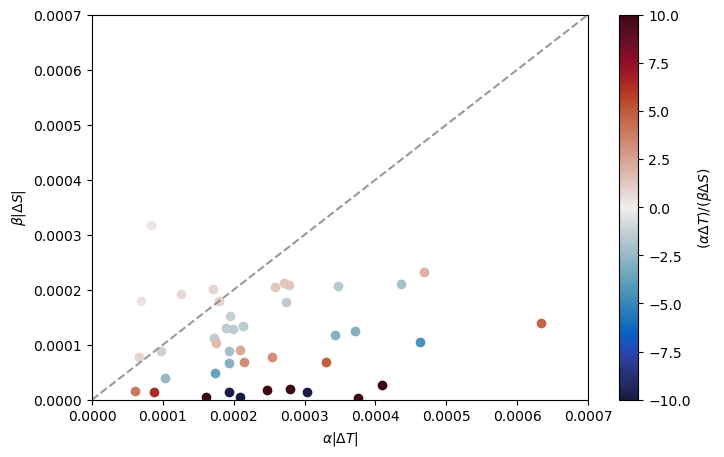

In [9]:
plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):
    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]
    #print((alpha*d_temp)/(beta*d_sal))
    
    sc = plt.scatter(alpha * np.abs(d_temp), beta * np.abs(d_sal),c=(alpha*d_temp)/(beta*d_sal), cmap=cmocean.cm.balance,vmin=-10,vmax=10)#,color='k')
plt.colorbar(sc,label=r'($\alpha \Delta T)/(\beta \Delta S)$')
plt.plot([0,1],[0,1],'gray',linestyle='--',alpha=0.8)
plt.xlim(-0.0,0.0007)
plt.ylim(-0.0,0.0007)
plt.xlabel(r'$\alpha |\Delta T|$')
plt.ylabel(r'$\beta |\Delta S|$')
plt.show()

In [10]:
df

,SD,hour,year,month,lat,phase,Avg Alpha,Avg Beta,Sal Diff,Temp Diff
0,1006,9,2017,11,7.995029,5.084179,0.000312,0.000720,-0.006929,-0.518000
1,1006,21,2017,11,7.963386,5.162990,0.000312,0.000720,0.093700,-0.619443
2,1006,10,2017,11,7.398142,5.314903,0.000311,0.000721,0.212471,-0.625214
3,1006,1,2017,12,1.801646,3.854970,0.000283,0.000727,0.284229,-1.223900
4,1006,13,2018,2,4.393711,4.880768,0.000304,0.000722,-0.003857,-1.234271
5,1005,20,2017,11,7.423547,5.609490,0.000312,0.000720,0.156643,-0.550657
6,1005,8,2018,1,4.919709,4.433847,0.000299,0.000723,-0.094143,-0.715957
7,1005,22,2018,1,5.431602,4.748405,0.000303,0.000722,-0.143386,-0.577200
8,1029,18,2018,12,3.841463,2.607628,0.000311,0.000721,0.019686,-0.622471
9,1069,22,2019,7,3.394784,NaN,0.000315,0.000720,0.180786,-0.602171


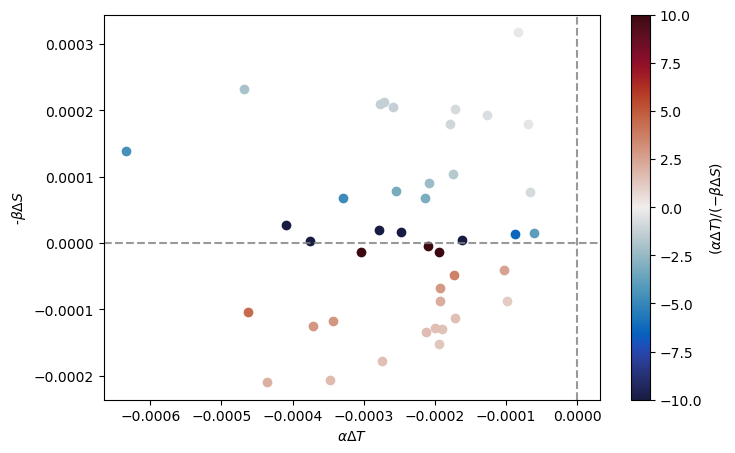

In [11]:
plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):
    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]
    
    sc = plt.scatter(alpha * d_temp, -beta * d_sal,c=(alpha*d_temp)/(-beta*d_sal), cmap=cmocean.cm.balance,vmin=-10,vmax=10)
plt.colorbar(sc,label=r'($\alpha \Delta T)/(-\beta \Delta S)$')
plt.axhline(0,color='gray',linestyle='--',alpha=0.8)
plt.axvline(0,color='gray',linestyle='--',alpha=0.8)
#plt.plot([0,1],[0,1],'gray',linestyle='--',alpha=0.8)
#plt.xlim(-0.0,0.0007)
#plt.ylim(-0.0,0.0007)
plt.xlabel(r'$\alpha \Delta T$')
plt.ylabel(r'-$\beta \Delta S$')
plt.show()

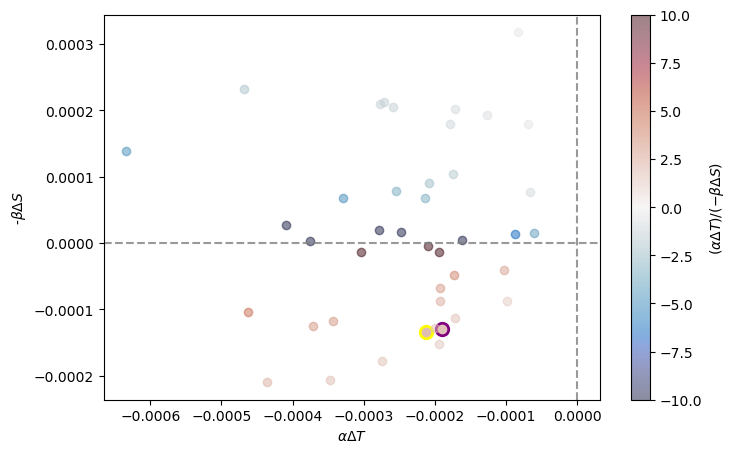

In [12]:
plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):
    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]

    front_SD = df['SD'].iloc[front_num]
    front_hour = df['hour'].iloc[front_num]

    sc = plt.scatter(alpha * d_temp, -beta * d_sal,c=(alpha*d_temp)/(-beta*d_sal), cmap=cmocean.cm.balance,vmin=-10,vmax=10,alpha=0.5)

    if front_SD == 1069 and front_hour == 22:
        plt.scatter(alpha * d_temp, -beta * d_sal,c='purple',s=100)
        plt.scatter(alpha * d_temp, -beta * d_sal,c=(alpha*d_temp)/(-beta*d_sal), cmap=cmocean.cm.balance,vmin=-10,vmax=10)

    if front_SD == 1068 and front_hour == 21:
        plt.scatter(alpha * d_temp, -beta * d_sal,c='yellow',s=100)
        plt.scatter(alpha * d_temp, -beta * d_sal,c=(alpha*d_temp)/(-beta*d_sal), cmap=cmocean.cm.balance,vmin=-10,vmax=10)
    
    
plt.colorbar(sc,label=r'($\alpha \Delta T)/(-\beta \Delta S)$')
plt.axhline(0,color='gray',linestyle='--',alpha=0.8)
plt.axvline(0,color='gray',linestyle='--',alpha=0.8)
#plt.plot([0,1],[0,1],'gray',linestyle='--',alpha=0.8)
#plt.xlim(-0.0,0.0007)
#plt.ylim(-0.0,0.0007)
plt.xlabel(r'$\alpha \Delta T$')
plt.ylabel(r'-$\beta \Delta S$')
plt.show()

In [13]:
front_num

41

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/1370872955.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')


1068
-0.91817142857143
1066
-1.1307999999999936


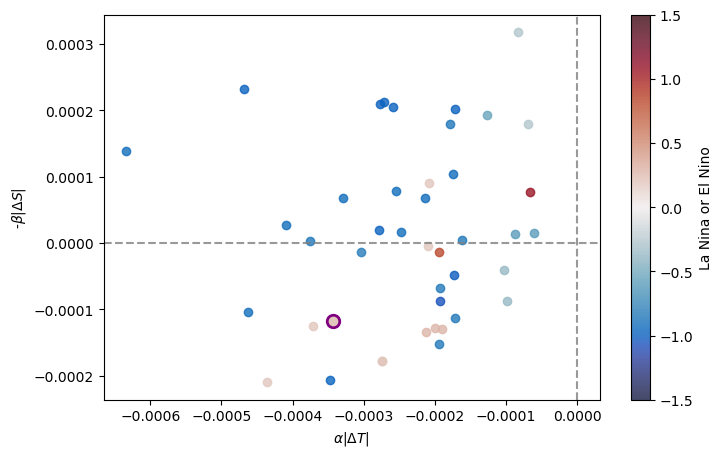

In [14]:
import pandas as pd
import cmocean

# Define the URL
url = 'https://psl.noaa.gov/data/correlation/oni.data'

# Read the data from the URL, skipping the first row
data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')

# Set proper column names
data.columns = ['Year', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set 'Year' as the index
data.set_index('Year', inplace=True)

plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):

    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]


    year = df['year'].iloc[front_num]
    month = df['month'].iloc[front_num]

    # find when the year and month of the front correspond to the oni data
    oni_value = data.loc[year, data.columns[month-1]]  # 'month' corresponds to the column index (1-12)
    
   # print(f"Year: {year}, Month: {month}, ONI Value: {oni_value}")

    #sc = plt.scatter(alpha * np.abs(d_temp), beta * np.abs(d_sal),c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
    

    sc = plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5,alpha = 0.8)

    front_SD = df['SD'].iloc[front_num]
    front_hour = df['hour'].iloc[front_num]
    front_month = df['month'].iloc[front_num]
   # if front_SD == 1069 and front_hour == 22:
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c='purple',s=100)
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
   #     print(d_temp)

   # if front_SD == 1068 and front_hour == 21:
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c='yellow',s=100)
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
   #     print(d_temp)

   # if front_SD == 1067 and front_hour == 1:
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c='black',s=100)
   #     plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
   #     print(d_temp)

    if front_SD == 1068 and front_hour == 2 and front_month == 9:
       # plt.scatter(alpha * d_temp, -beta * d_sal,c='purple',s=100)
        plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
        print(front_SD)
        print(d_temp)

    if front_SD == 1066 and front_hour == 2 and front_month == 9:
        plt.scatter(alpha * d_temp, -beta * d_sal,c='purple',s=100)
        plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
        print(front_SD)
        print(d_temp)
    

plt.colorbar(sc,label='La Nina or El Nino')

plt.axhline(0,color='gray',linestyle='--',alpha=0.8)
plt.axvline(0,color='gray',linestyle='--',alpha=0.8)
plt.xlabel(r'$\alpha |\Delta T|$')
plt.ylabel(r'-$\beta |\Delta S|$')
plt.show()

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/362167189.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


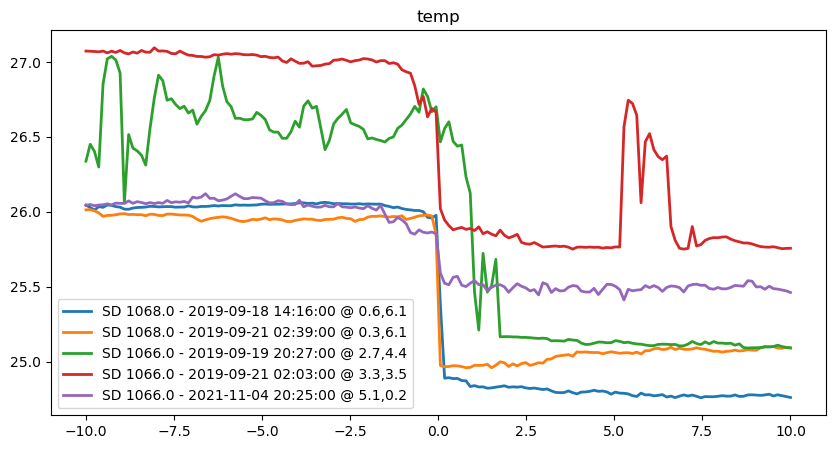

In [15]:
import numpy as np
import matplotlib.pyplot as plt

def plot_all_sections_casestudy(padded_sections, frontinfo_df, var, ylabel):
    plt.figure(figsize=(10, 5))
    all_var_values = []  # To store values for computing the composite line
    
    for i, sec in enumerate(padded_sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        if var == 'SW' or var == 'SW':
            plot_var = detrend(sec[var])
        else:
            plot_var = detrend(sec[var])

        plot_var = sec[var]


        # Store the data for the composite line
        all_var_values.append(plot_var)

        front_SD = df.iloc[i]['SD']
        
        front_hour = df.iloc[i]['hour']
        
        #if front_SD == 1069 and front_hour == 22:
        #    plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
        #             label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
        #if front_SD == 1068 and front_hour == 21:
         #   plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
        #             label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
    
        #if front_SD == 1067 and front_hour == 1:
        #    plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
        #             label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')



        if front_SD == 1068 and front_hour == 14:
            plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                     label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
        if front_SD == 1066 and front_hour == 20:
            plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                     label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
    
        if front_SD == 1068 and front_hour == 2:
            plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                     label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
        if front_SD == 1066 and front_hour == 2:
            plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                     label=f'SD {front_SD} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}')
            
        plt.title(var)
        plt.legend()


        

plot_all_sections_casestudy(padded_sections, frontinfo_df, 'temp', ' ')

In [16]:
front_time

'12/29/24 11:54'

In [17]:

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['T10MIN'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['T10MIN']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def orient_section(section):
    n_avg = min(3, len(section['SST']) // 4)
    start_temp = np.nanmean(section['SST'][:n_avg])
    end_temp = np.nanmean(section['SST'][-n_avg:])

    if start_temp < end_temp:
        for key in section:
            section[key] = section[key][::-1]
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    # Compute the mean and standard deviation of the series
    mean = np.nanmean(series)
    std = np.nanstd(series)
    
    # Calculate the z-score for each data point
    return (series - mean) / std
    
# smooth composite
from scipy.ndimage import gaussian_filter1d
# plot function: 
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1,color='black'):
    plt.figure(figsize=(10, 5))
    
    for i, composite in enumerate(all_composites):
        #color='black'
            
        dist_km = all_dist_km[i]
          
        composite_var = composite[var]
        #composite_var = detrend(composite[var])
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)

        #plt.plot(dist_km, composite_var_smooth, color=color, 
        #         linewidth=4)#, label=case_names[i])

            # Compute standard deviation (assume multiple realizations exist)
        std_dev = np.std(composite_var_smooth)

        # Plot main line
        plt.plot(dist_km, composite_var_smooth, color='black', linewidth=4)

        # Add error bars as a shaded region
        plt.fill_between(dist_km, composite_var_smooth - std_dev, composite_var_smooth + std_dev, 
                         color='gray', alpha=0.2)

    plt.axvline(0, color='gray', linestyle='--', zorder=5)
   # plt.axhline(0, color='gray', linestyle='--', zorder=5)

    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)

    plt.show()
# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [6, 7, 8,1]
cases = [1]
for case in cases:

    if case == 1: 
        case_df = frontinfo_df#[frontinfo_df['idx'] ==138328]
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']
        file_path = f'/Volumes/external/TIW/data/saildrone/{year}/1min/TPOS-{year}_SD{sd}_1min.nc'

        try:
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/processed_coare/TPOS{year}Saildrone{sd}curf.cdf')
            section = slice_around_front(data, front_time)
            if len(section['SST']) > 0 and not np.all(np.isnan(section['SST'])):
                section = orient_section(section)
                sections.append(section)
            else:
                print(f"Skipping front {idx}: No valid data.")
        except Exception as e:
            print(f"Failed to process front {idx} in {file_path}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['SST']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}
    for key in padded_sections[0]:
        if key != 'time':
            composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)

    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)

42
Failed to process front 37 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 40 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 45 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 46 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1066curf.cdf'
Failed to process front 47 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1mi

In [18]:
padded_sections

[{'LON': array([-125.08673152, -125.09056768, -125.094192  , -125.09752256,
         -125.0990272 , -125.09870528, -125.09312384, -125.0921376 ,
         -125.09374848, -125.09584704, -125.098176  , -125.09909568,
         -125.09713024, -125.09350912, -125.08990144, -125.08710528,
         -125.08471232, -125.08250944, -125.08226944, -125.08541696,
         -125.0885696 , -125.09210368, -125.09647552, -125.09860288,
         -125.09479616, -125.08936768, -125.08600128, -125.08347136,
         -125.08168384, -125.08162368, -125.0853216 , -125.0898432 ,
         -125.09380032, -125.09718784, -125.099408  , -125.09790464,
         -125.09596928, -125.09462528, -125.09401344, -125.09310464,
         -125.09191232, -125.09091328, -125.08968512, -125.08892224,
         -125.08745984, -125.08518336, -125.08243392, -125.07955136,
         -125.07630464, -125.07299456, -125.06998272, -125.06690944,
         -125.0640544 , -125.06020672, -125.0560096 , -125.05355648,
         -125.05345536, -12

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/362167189.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/326118163.py:35: RuntimeWarning: Mean of empty slice
  return series - np.nanmean(series)


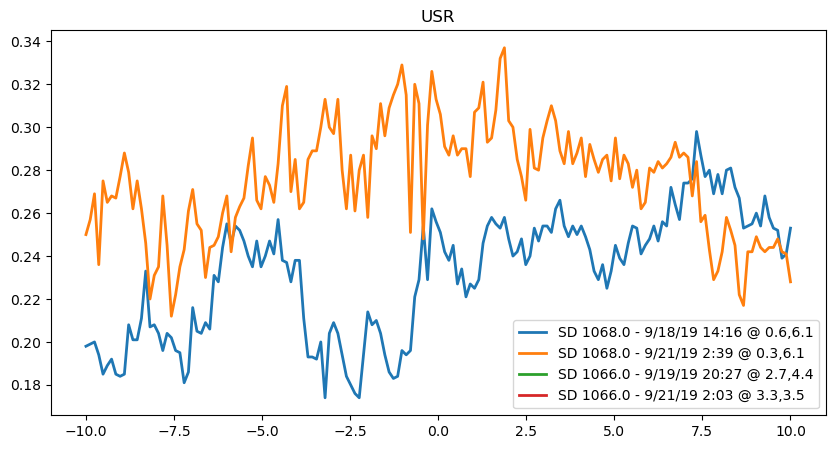

In [19]:
plot_all_sections_casestudy(padded_sections, frontinfo_df, 'USR', ' ')

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/445523777.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')


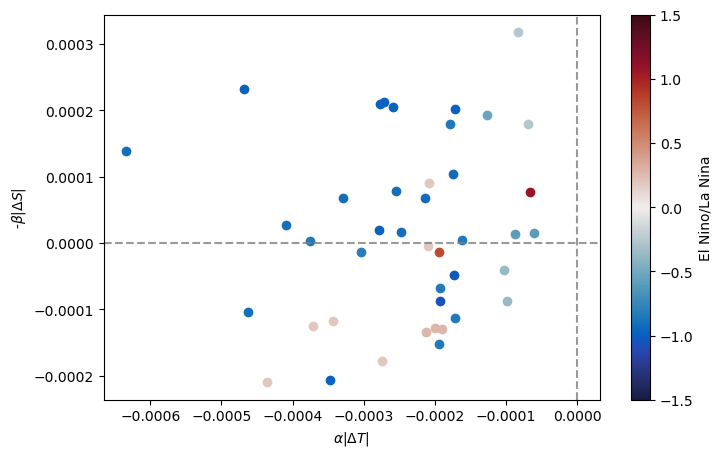

In [20]:
import pandas as pd
import cmocean

# Define the URL
url = 'https://psl.noaa.gov/data/correlation/oni.data'

# Read the data from the URL, skipping the first row
data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')

# Set proper column names
data.columns = ['Year', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set 'Year' as the index
data.set_index('Year', inplace=True)

plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):

    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]

    year = df['year'].iloc[front_num]
    month = df['month'].iloc[front_num]

    # find when the year and month of the front correspond to the oni data
    oni_value = data.loc[year, data.columns[month-1]]  # 'month' corresponds to the column index (1-12)
    
   # print(f"Year: {year}, Month: {month}, ONI Value: {oni_value}")

    #sc = plt.scatter(alpha * np.abs(d_temp), beta * np.abs(d_sal),c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)
    sc = plt.scatter(alpha * d_temp, -beta * d_sal,c=oni_value,cmap=cmocean.cm.balance,vmin=-1.5,vmax=1.5)

plt.colorbar(sc,label='El Nino/La Nina')

plt.axhline(0,color='gray',linestyle='--',alpha=0.8)
plt.axvline(0,color='gray',linestyle='--',alpha=0.8)
plt.xlabel(r'$\alpha |\Delta T|$')
plt.ylabel(r'-$\beta |\Delta S|$')
plt.show()

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/3535967300.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')


<Figure size 800x500 with 0 Axes>

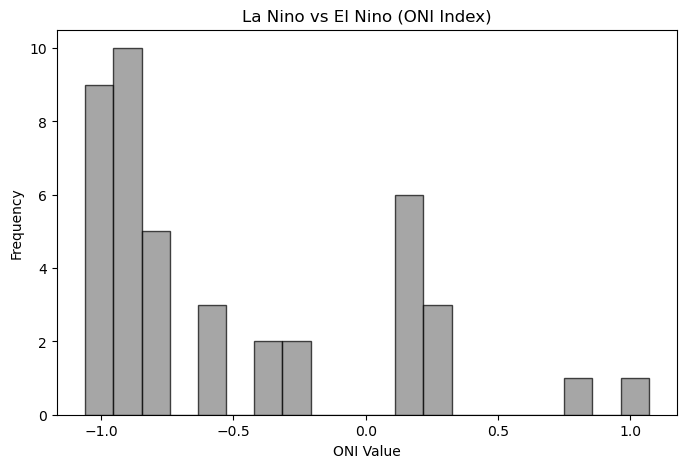

In [21]:
import pandas as pd
import cmocean

# Define the URL
url = 'https://psl.noaa.gov/data/correlation/oni.data'

# Read the data from the URL, skipping the first row
data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')

# Set proper column names
data.columns = ['Year', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set 'Year' as the index
data.set_index('Year', inplace=True)

plt.figure(figsize=(8,5))
# Collect ONI values for the relevant fronts
oni_values = []

# Loop through the fronts data (assuming `df` is the DataFrame for your fronts)
for front_num in range(0, len(df)):
    year = df['year'].iloc[front_num]
    month = df['month'].iloc[front_num]

    # Find when the year and month of the front correspond to the ONI data
    try:
        oni_value = data.loc[year, data.columns[month-1]]  # 'month' corresponds to the column index (1-12)
        oni_values.append(oni_value)
    except KeyError:
        print(f"ONI data not available for year {year} and month {month}")

# Plot the histogram of ONI values
plt.figure(figsize=(8,5))
plt.hist(oni_values, bins=20, color='gray', edgecolor='black', alpha=0.7)
plt.xlabel('ONI Value')
plt.ylabel('Frequency')
plt.title('La Nino vs El Nino (ONI Index)')
plt.show()

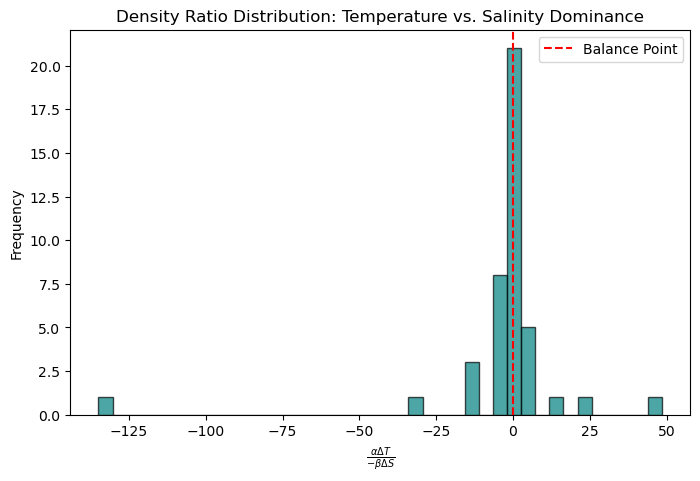

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the ratio for each front
density_ratio = (df['Avg Alpha'] * df['Temp Diff']) / (-df['Avg Beta'] * df['Sal Diff'])

# Plotting the density ratio
plt.figure(figsize=(8,5))
plt.hist(density_ratio, bins=40, color='teal', edgecolor='black', alpha=0.7)
plt.xlabel(r'$\frac{\alpha \Delta T}{-\beta \Delta S}$')
plt.ylabel('Frequency')
plt.title('Density Ratio Distribution: Temperature vs. Salinity Dominance')
plt.axvline(0, color='red', linestyle='--', label='Balance Point')
plt.legend()
plt.show()


/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/657189405.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')


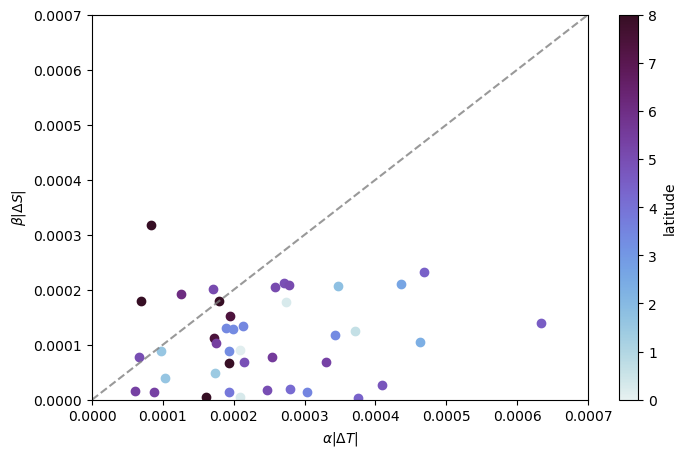

In [23]:
import pandas as pd
import cmocean

# Define the URL
url = 'https://psl.noaa.gov/data/correlation/oni.data'

# Read the data from the URL, skipping the first row
data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')

# Set proper column names
data.columns = ['Year', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set 'Year' as the index
data.set_index('Year', inplace=True)

plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):

    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]

    year = df['year'].iloc[front_num]
    month = df['month'].iloc[front_num]

    # find when the year and month of the front correspond to the oni data
    oni_value = data.loc[year, data.columns[month-1]]  # 'month' corresponds to the column index (1-12)
    
   # print(f"Year: {year}, Month: {month}, ONI Value: {oni_value}")

    sc = plt.scatter(alpha * np.abs(d_temp), beta * np.abs(d_sal),c=df['lat'].iloc[front_num],cmap=cmocean.cm.dense,vmin=0,vmax=8)

plt.colorbar(sc,label='latitude')

plt.plot([0,1],[0,1],'gray',linestyle='--',alpha=0.8)
plt.xlim(-0.0,0.0007)
plt.ylim(-0.0,0.0007)
plt.xlabel(r'$\alpha |\Delta T|$')
plt.ylabel(r'$\beta |\Delta S|$')
plt.show()

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/2343037145.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')


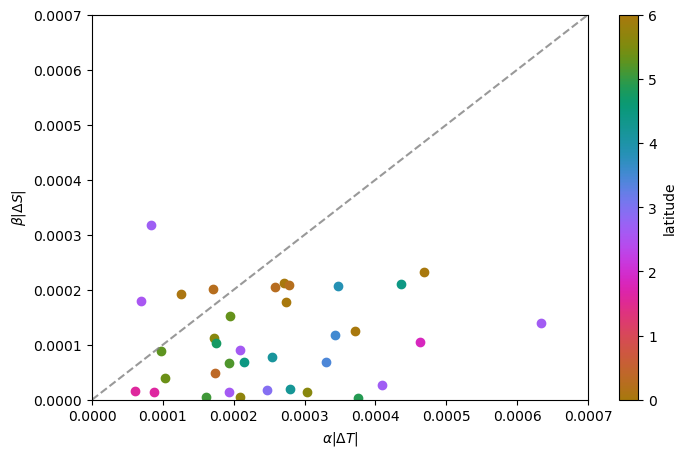

In [24]:
import pandas as pd
import cmocean

# Define the URL
url = 'https://psl.noaa.gov/data/correlation/oni.data'

# Read the data from the URL, skipping the first row
data = pd.read_csv(url, delim_whitespace=True, header=None, skiprows=1, skipfooter=8, engine='python')

# Set proper column names
data.columns = ['Year', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set 'Year' as the index
data.set_index('Year', inplace=True)

plt.figure(figsize=(8,5))
for front_num in range(0, len(df)):

    alpha = df['Avg Alpha'].iloc[front_num]
    beta = df['Avg Beta'].iloc[front_num]
    d_sal = df['Sal Diff'].iloc[front_num]
    d_temp = df['Temp Diff'].iloc[front_num]

    year = df['year'].iloc[front_num]
    month = df['month'].iloc[front_num]

    # find when the year and month of the front correspond to the oni data
    oni_value = data.loc[year, data.columns[month-1]]  # 'month' corresponds to the column index (1-12)
    
   # print(f"Year: {year}, Month: {month}, ONI Value: {oni_value}")

    sc = plt.scatter(alpha * np.abs(d_temp), beta * np.abs(d_sal),c=df['phase'].iloc[front_num],cmap=cmocean.cm.phase,vmin=0,vmax=6)

plt.colorbar(sc,label='latitude')

plt.plot([0,1],[0,1],'gray',linestyle='--',alpha=0.8)
plt.xlim(-0.0,0.0007)
plt.ylim(-0.0,0.0007)
plt.xlabel(r'$\alpha |\Delta T|$')
plt.ylabel(r'$\beta |\Delta S|$')
plt.show()

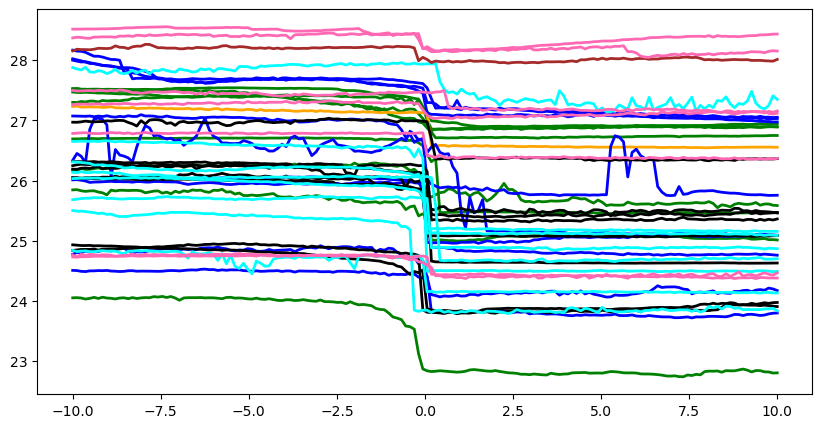

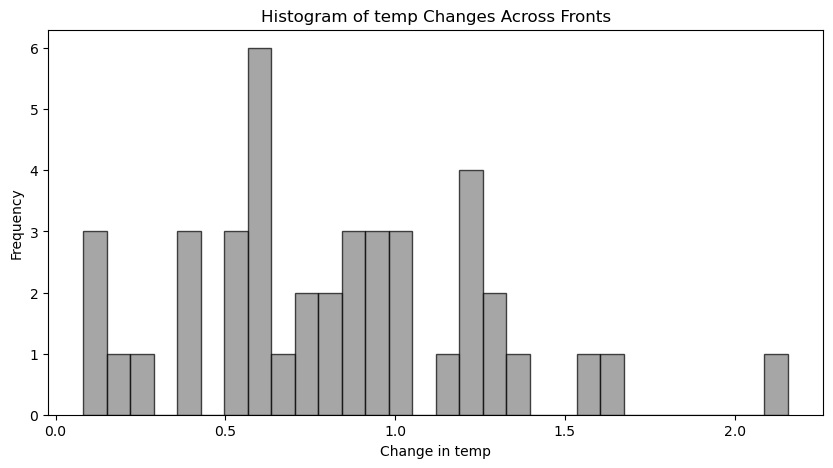

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def plot_all_sections(padded_sections, frontinfo_df, var, ylabel):
    plt.figure(figsize=(10, 5))
    all_var_values = []  # To store values for computing the composite line
    
    for i, sec in enumerate(padded_sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        if var == 'SW' or var == 'SW':
            plot_var = detrend(sec[var])
        else:
            plot_var = detrend(sec[var])

        plot_var = sec[var]


        # Store the data for the composite line
        all_var_values.append(plot_var)

        # Plot individual front sections
        plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                 label=f'Front {i+1} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}',
                 color=color)
        
        #plt.ylim(-1.2, 1.2)

    # Convert list to NumPy array for proper indexing
    all_var_values = np.array(all_var_values)  # Now it's shape (42, 166)

    # Compute and plot histogram of frontal changes
    plt.figure(figsize=(10, 5))
    changes = all_var_values[:, 165] - all_var_values[:, 0]  # Difference between first and last columns
    plt.hist(np.abs(changes), bins=30, color='gray', edgecolor='black', alpha=0.7)
    plt.xlabel(f'Change in {var}')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {var} Changes Across Fronts')
    plt.show()

plot_all_sections(padded_sections, frontinfo_df, 'temp', ' ')

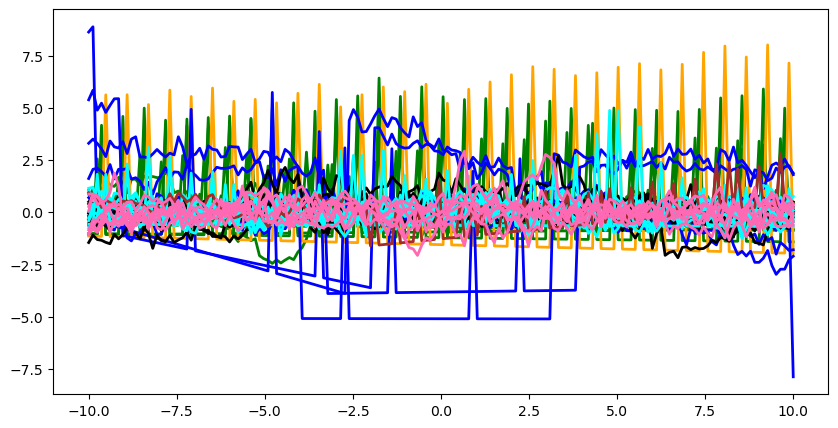

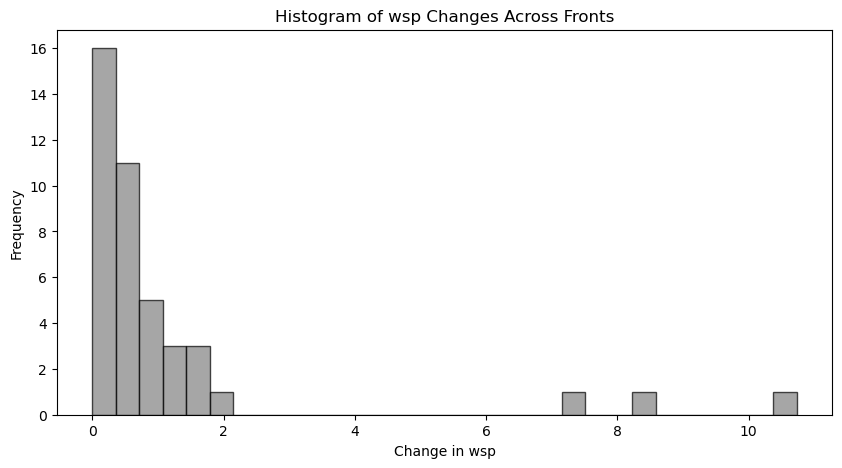

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def detrend_with_cleanup(data):
    """Detrends data and handles NaN and Inf values."""
    # Replace NaN and Inf with zeros or another placeholder value (e.g., np.nan)
    cleaned_data = np.nan_to_num(data, nan=0, posinf=0, neginf=0)
    return signal.detrend(cleaned_data)

def plot_all_sections(padded_sections, frontinfo_df, var, ylabel):
    plt.figure(figsize=(10, 5))
    #plt.ylim(-2.5,2.5)
    all_var_values = []  # To store values for computing the composite line
    
    
    for i, sec in enumerate(padded_sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        if var == 'SW' or var == 'SW':
            plot_var = detrend_with_cleanup(sec[var])
        else:
            plot_var = detrend_with_cleanup(sec[var])

        # Store the data for the composite line
        all_var_values.append(plot_var)

        # Plot individual front sections
        plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                 label=f'Front {i+1} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}',
                 color=color)

    # Convert list to NumPy array for proper indexing
    all_var_values = np.array(all_var_values)  # Now it's shape (42, 166)

    # Compute and plot histogram of frontal changes
    plt.figure(figsize=(10, 5))
    changes = all_var_values[:, 165] - all_var_values[:, 0]  # Difference between first and last columns
    plt.hist(np.abs(changes), bins=30, color='gray', edgecolor='black', alpha=0.7)
    plt.xlabel(f'Change in {var}')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {var} Changes Across Fronts')
    plt.show()

plot_all_sections(padded_sections, frontinfo_df, 'wsp', ' ')


/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_46274/3090362301.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


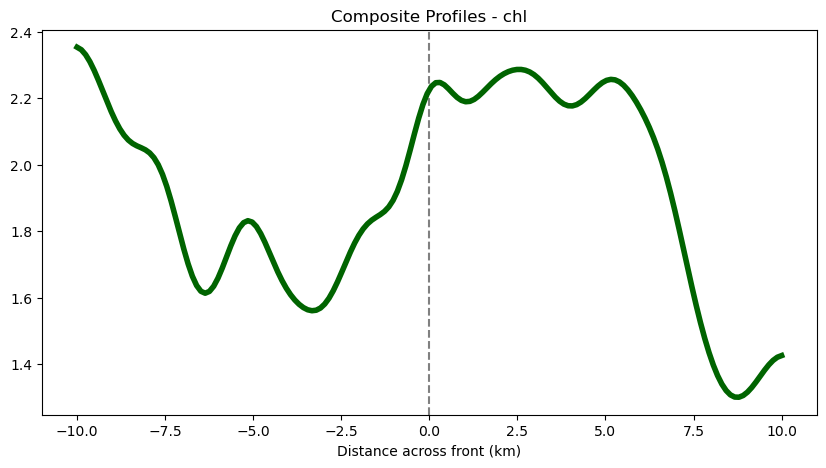

In [20]:
# plot function: 
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1):

    plt.figure(figsize=(10, 5))

    # Define distinct colors for each case
    plt.axvline(0, color='gray', linestyle='--')
    #plt.axhline(0, color='gray', linestyle='--')

    for i, composite in enumerate(all_composites):
        color='black'
            
        dist_km = all_dist_km[i]
          
        composite_var = composite[var]

        # Apply smoothing (Gaussian filter)
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)
        #composite_var_smooth = detrend(composite_var_smooth)
        # Plot with color and label
        plt.plot(dist_km, composite_var_smooth, color='darkgreen', 
                 linewidth=4)#, label=case_names[i])

    # Front location line


    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)


    plt.show()
    
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='chl', ylabel='', smooth_window=5)

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_46274/1477853697.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


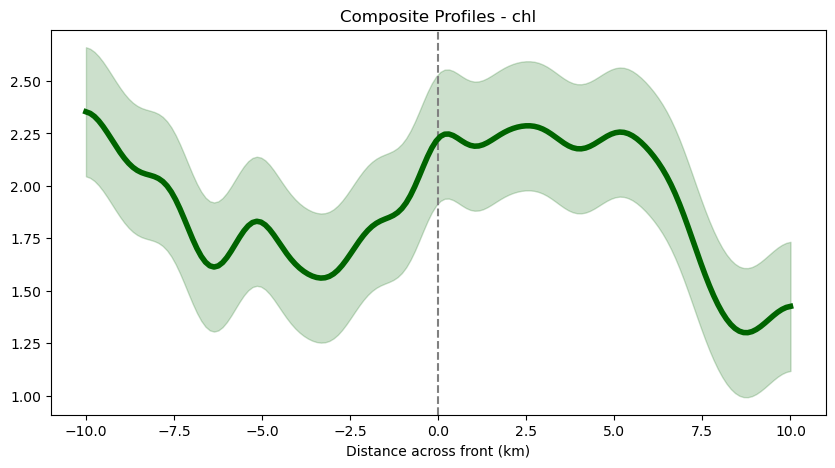

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1):
    plt.figure(figsize=(10, 5))

    # Define distinct colors for each case
    plt.axvline(0, color='gray', linestyle='--')

    for i, composite in enumerate(all_composites):
        dist_km = all_dist_km[i]
        composite_var = composite[var]

        # Apply smoothing (Gaussian filter)
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)

        # Compute standard deviation (assume multiple realizations exist)
        std_dev = np.std(composite_var_smooth)

        # Plot main line
        plt.plot(dist_km, composite_var_smooth,  color='darkgreen', linewidth=4)

        # Add error bars as a shaded region
        plt.fill_between(dist_km, composite_var_smooth - std_dev, composite_var_smooth + std_dev, 
                         color='darkgreen', alpha=0.2)

    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)

    plt.show()
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='chl', ylabel='', smooth_window=5)

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_46274/2358450572.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


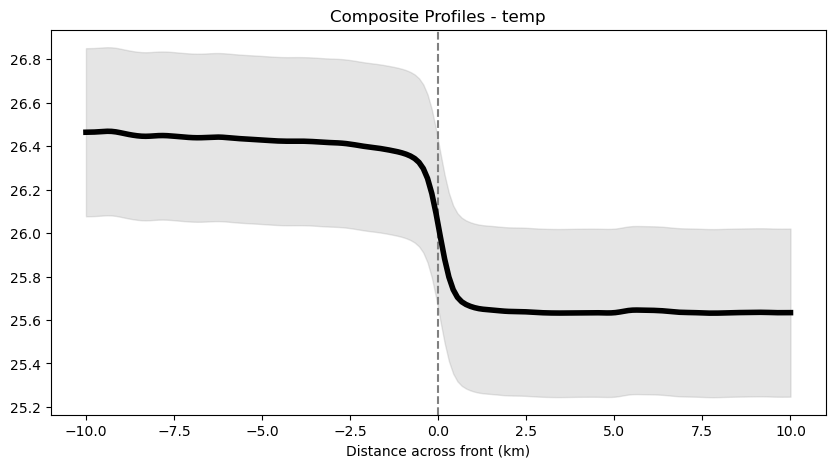

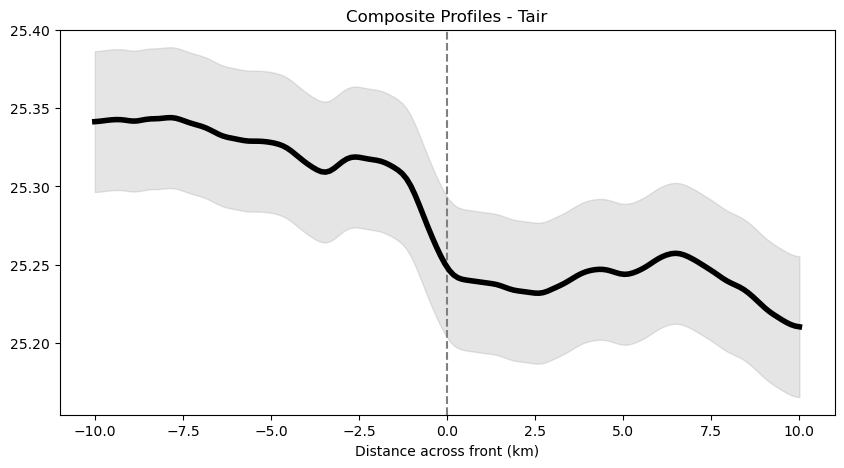

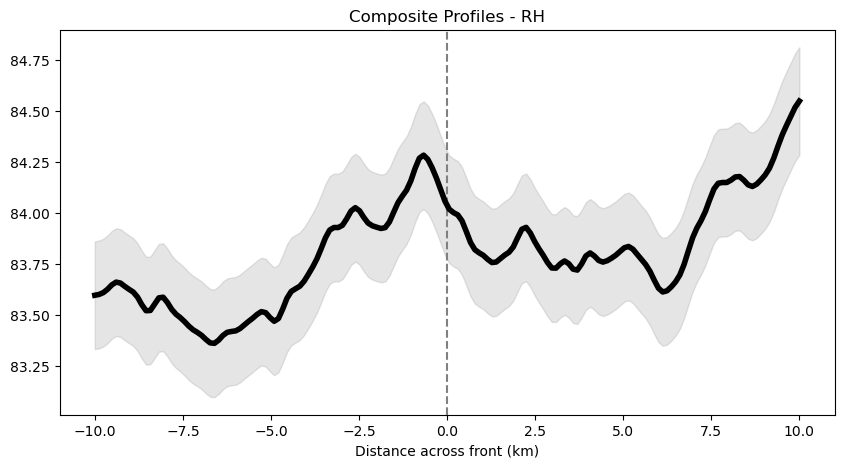

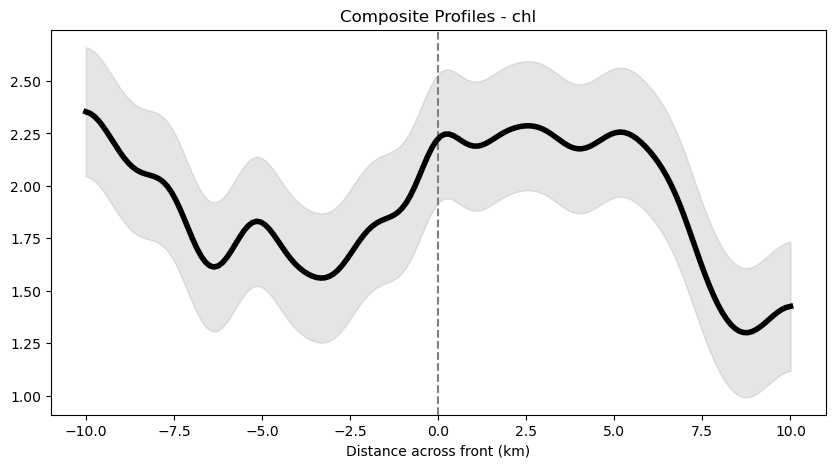

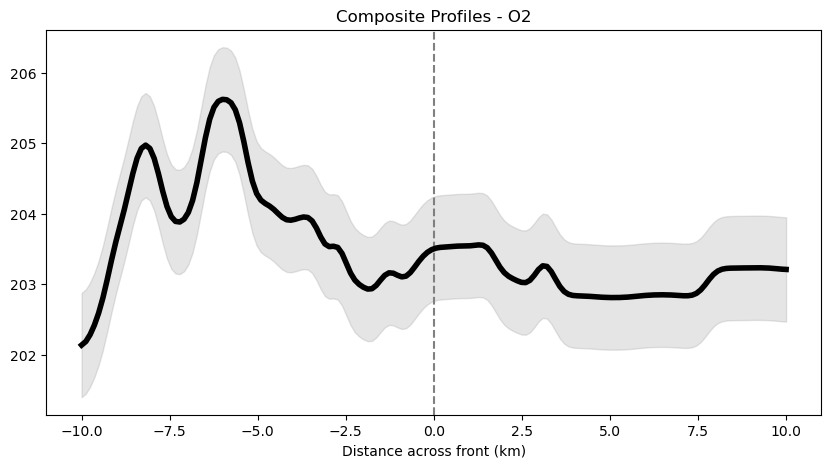

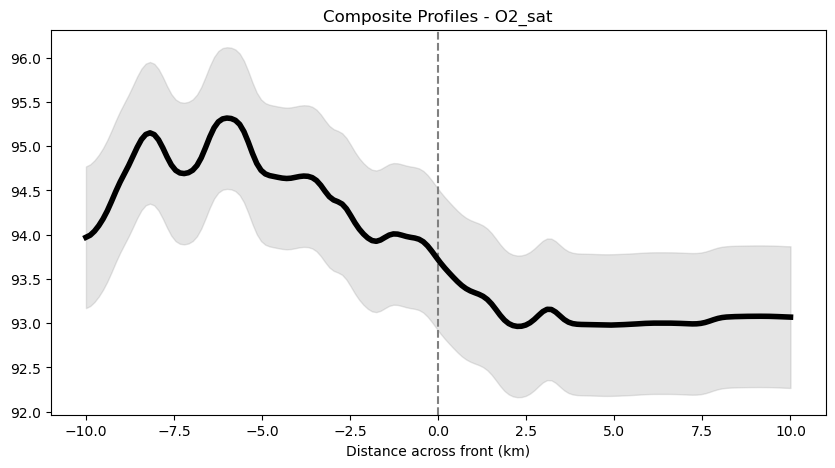

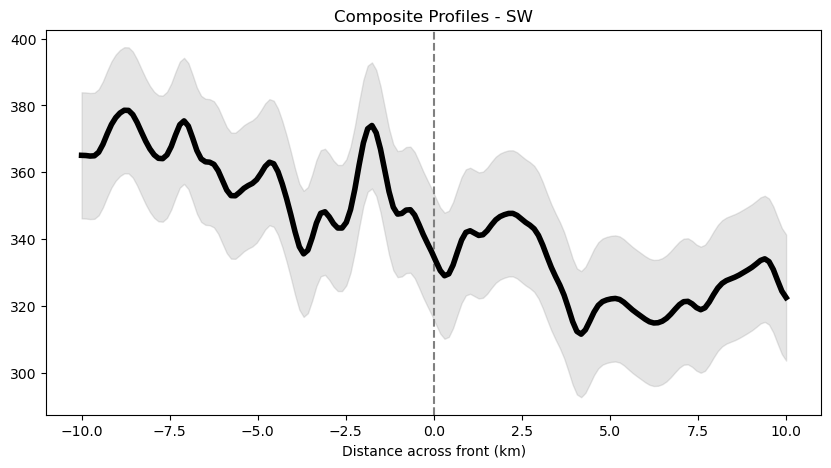

In [22]:
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='temp', ylabel='', smooth_window=2)
#plot_all_cases_composite(all_composites, all_dist_km, case_names, var='wsp', ylabel='', smooth_window=1)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='Tair', ylabel='', smooth_window=2)
#plot_all_cases_composite(all_composites, all_dist_km, case_names, var='gust', ylabel='', smooth_window=2)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='RH', ylabel='', smooth_window=2)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='chl', ylabel='', smooth_window=5)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='O2', ylabel='', smooth_window=2)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='O2_sat', ylabel='', smooth_window=2)
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='SW', ylabel='', smooth_window=2)
#plot_all_cases_composite(all_composites, all_dist_km, case_names, var='AOU', ylabel='AOU (mmol/m^3)', smooth_window=3)

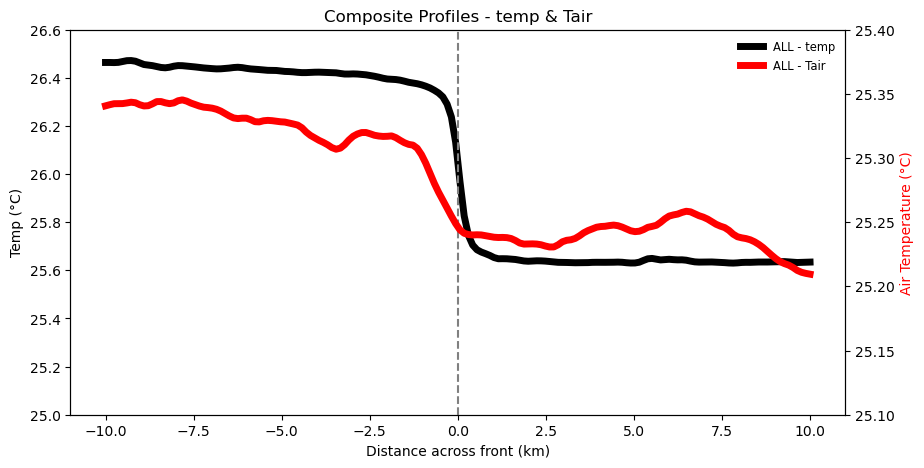

In [23]:
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, var1, var2, ylabel1, ylabel2, 
                             smooth_window=1, ylim1=None, ylim2=None):

    fig, ax1 = plt.subplots(figsize=(10, 5))

    ax2 = ax1.twinx()  # Create a second y-axis

    for i, composite in enumerate(all_composites):
        color1 = 'black'  # Color for var1
        color2 = 'red'    # Color for var2
        
        dist_km = all_dist_km[i]

        # Apply smoothing
        composite_var1_smooth = gaussian_filter1d(composite[var1], sigma=smooth_window)
        composite_var2_smooth = gaussian_filter1d(composite[var2], sigma=smooth_window)

        # Plot var1 on primary axis
        ax1.plot(dist_km, composite_var1_smooth, color=color1, linewidth=5, label=f'{case_names[i]} - {var1}')

        # Plot var2 on secondary axis
        ax2.plot(dist_km, composite_var2_smooth, color=color2, linewidth=5, label=f'{case_names[i]} - {var2}')

    # Front location line
    ax1.axvline(0, color='gray', linestyle='--', zorder=5)

    # Axis labels and title
    ax1.set_xlabel('Distance across front (km)')
    ax1.set_ylabel(ylabel1, color='black')
    ax2.set_ylabel(ylabel2, color='red')

    # Apply user-defined limits
    if ylim1:
        ax1.set_ylim(ylim1)
    if ylim2:
        ax2.set_ylim(ylim2)

    ax1.set_title(f'Composite Profiles - {var1} & {var2}')

    # Combine legends from both axes
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize='small', frameon=False)

    plt.show()

# Example call:
plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, 
                         var1='temp', var2='Tair', 
                         ylabel1='Temp (°C)', ylabel2='Air Temperature (°C)', 
                         smooth_window=1, ylim1=(25, 26.6), ylim2=(25.1, 25.4))


## repeat for coare data

In [38]:

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['T10MIN'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['T10MIN']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def orient_section(section):
    n_avg = min(3, len(section['SST']) // 4)
    start_temp = np.nanmean(section['SST'][:n_avg])
    end_temp = np.nanmean(section['SST'][-n_avg:])

    if start_temp < end_temp:
        for key in section:
            section[key] = section[key][::-1]
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    # Compute the mean and standard deviation of the series
    mean = np.nanmean(series)
    std = np.nanstd(series)
    
    # Calculate the z-score for each data point
    return (series - mean) / std
    
# smooth composite
from scipy.ndimage import gaussian_filter1d
# plot function: 
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1,color='black'):
    plt.figure(figsize=(10, 5))
    
    for i, composite in enumerate(all_composites):
        #color='black'
            
        dist_km = all_dist_km[i]
          
        composite_var = composite[var]
        #composite_var = detrend(composite[var])
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)

        #plt.plot(dist_km, composite_var_smooth, color=color, 
        #         linewidth=4)#, label=case_names[i])

            # Compute standard deviation (assume multiple realizations exist)
        std_dev = np.std(composite_var_smooth)

        # Plot main line
        plt.plot(dist_km, composite_var_smooth, color=color, linewidth=4)

        # Add error bars as a shaded region
        plt.fill_between(dist_km, composite_var_smooth - std_dev, composite_var_smooth + std_dev, 
                         color=color, alpha=0.2)

    plt.axvline(0, color='gray', linestyle='--', zorder=5)
   # plt.axhline(0, color='gray', linestyle='--', zorder=5)

    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)

    plt.show()
# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [6, 7, 8,1]
cases = [1]
for case in cases:

    if case == 1: 
        case_df = frontinfo_df#[frontinfo_df['idx'] ==138328]
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']
        file_path = f'/Volumes/external/TIW/data/saildrone/{year}/1min/TPOS-{year}_SD{sd}_1min.nc'

        try:
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/processed_coare/TPOS{year}Saildrone{sd}curf.cdf')
            section = slice_around_front(data, front_time)
            if len(section['SST']) > 0 and not np.all(np.isnan(section['SST'])):
                section = orient_section(section)
                sections.append(section)
            else:
                print(f"Skipping front {idx}: No valid data.")
        except Exception as e:
            print(f"Failed to process front {idx} in {file_path}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['SST']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}
    for key in padded_sections[0]:
        if key != 'time':
            composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)

    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)

42
Failed to process front 37 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 40 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 45 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 46 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1066curf.cdf'
Failed to process front 47 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1mi

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/1362810912.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


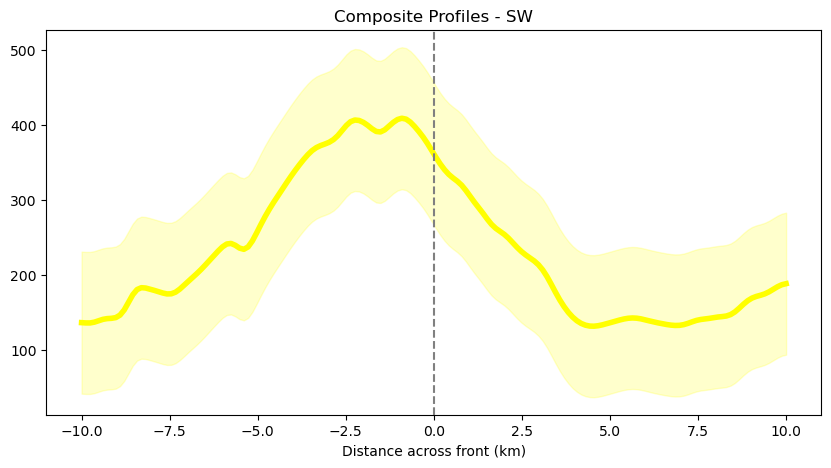

In [62]:
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='SW', ylabel='', smooth_window=2,color='yellow')

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_30923/1362810912.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


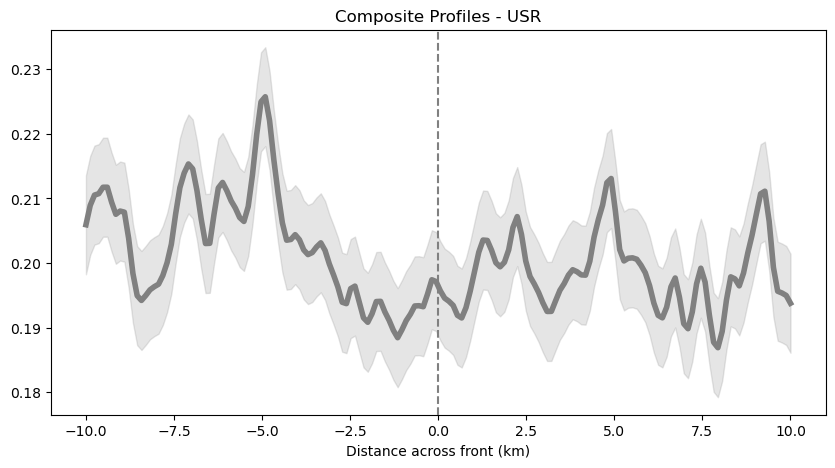

In [51]:
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='USR', ylabel='', smooth_window=1,color='grey')

In [44]:
data

<xarray.Dataset> Size: 9MB
Dimensions:    (T10MIN: 30663)
Coordinates:
  * T10MIN     (T10MIN) datetime64[ns] 245kB 2019-06-08T03:30:00 ... 2020-01-...
Data variables: (12/35)
    LON        (T10MIN) float64 245kB ...
    LAT        (T10MIN) float64 245kB ...
    SST        (T10MIN) float64 245kB ...
    SW         (T10MIN) float64 245kB ...
    LW         (T10MIN) float64 245kB ...
    SLP        (T10MIN) float64 245kB ...
    ...         ...
    TWARM      (T10MIN) float64 245kB ...
    USR        (T10MIN) float64 245kB ...
    UWND       (T10MIN) float64 245kB ...
    VWND       (T10MIN) float64 245kB ...
    TAIR       (T10MIN) float64 245kB ...
    RH         (T10MIN) float64 245kB ...
Attributes:
    history:      PyFerret V7.5 (optimized)  2-Mar-21
    Conventions:  CF-1.6

42
Failed to process front 37 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 40 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 45 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1065_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1065curf.cdf'
Failed to process front 46 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1min.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2021Saildrone1066curf.cdf'
Failed to process front 47 in /Volumes/external/TIW/data/saildrone/2021/1min/TPOS-2021_SD1066_1mi

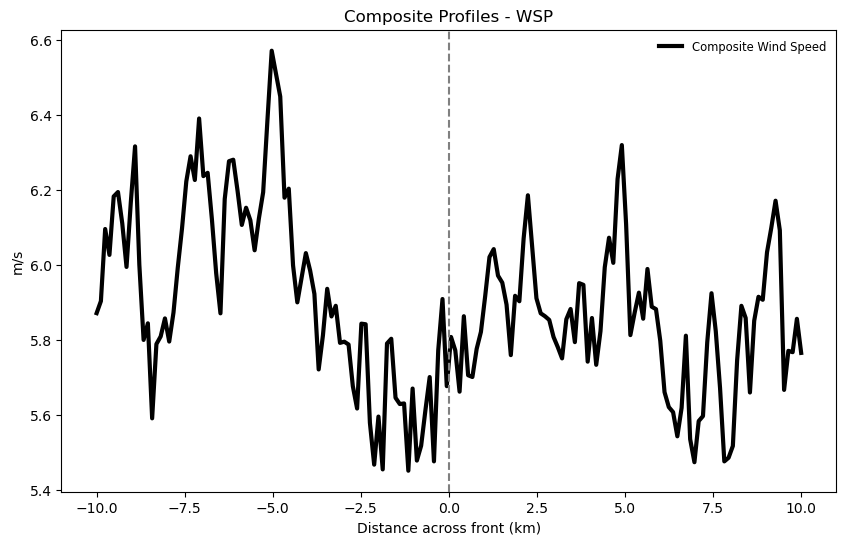

In [145]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Define the function to calculate wind speed
def compute_wind_speed(u_component, v_component):
    return np.sqrt(u_component**2 + v_component**2)

# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [1]
for case in cases:
    if case == 1: 
        case_df = frontinfo_df
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']
        file_path = f'/Volumes/external/TIW/data/saildrone/{year}/1min/TPOS-{year}_SD{sd}_1min.nc'

        try:
            # Open processed Saildrone dataset
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/processed_coare/TPOS{year}Saildrone{sd}curf.cdf')
            section = slice_around_front(data, front_time)
            
            # Check if valid SST data exists
            if len(section['SST']) > 0 and not np.all(np.isnan(section['SST'])):
                section = orient_section(section)
                
                # Compute wind speed and add to section
                if 'UWND' in section and 'VWND' in section:
                    wind_speed = compute_wind_speed(section['UWND'], section['VWND'])
                    section['wind_speed'] = wind_speed
                sections.append(section)
            else:
                print(f"Skipping front {idx}: No valid data.")
        except Exception as e:
            print(f"Failed to process front {idx} in {file_path}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['SST']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}
    for key in padded_sections[0]:
        if key != 'time':
            composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)

    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)

# Now plotting each front's wind speed and the composite wind speed as a bold black line
plt.figure(figsize=(10, 6))

# Plot each front's wind speed
#for section in sections:
#    plt.plot(dist_km, section['wind_speed'], color='lightgray', alpha=0.5)  # Light gray for individual fronts

# Plot the composite wind speed as a bold black line
composite_wind_speed = all_composites[0]['wind_speed']  # Assuming we're plotting the first case's wind speed
plt.plot(all_dist_km[0], composite_wind_speed, label='Composite Wind Speed', color='black', linewidth=3)

# Labels and Title
plt.axvline(0, color='gray', linestyle='--', zorder=5)
# plt.axhline(0, color='gray', linestyle='--', zorder=5)

plt.xlabel('Distance across front (km)')
plt.ylabel('m/s')
plt.title(f'Composite Profiles - WSP')
plt.legend(loc='upper right', fontsize='small', frameon=False)

plt.show()


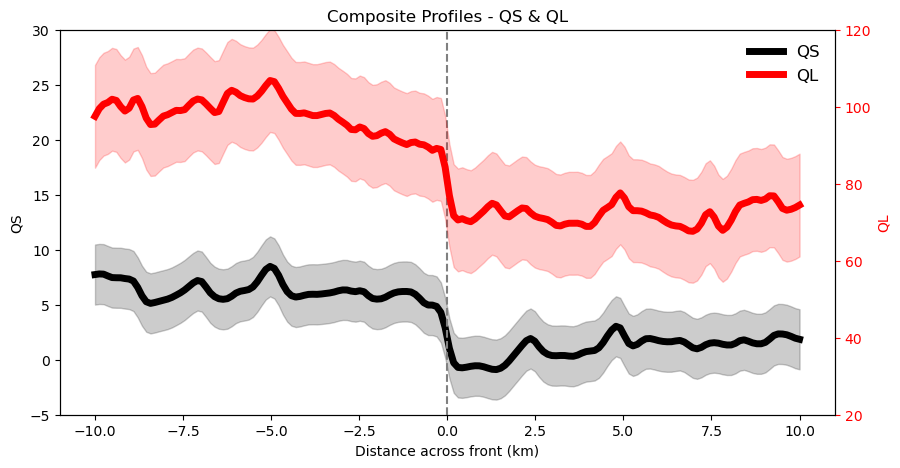

In [55]:
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, var1, var2, ylabel1, ylabel2, 
                             smooth_window=1, ylim1=None, ylim2=None,color1 = 'black',color2 = 'red' ):

    fig, ax1 = plt.subplots(figsize=(10, 5))

    ax2 = ax1.twinx()  # Create a second y-axis

    for i, composite in enumerate(all_composites):
        #color1 = 'black'  # Color for var1
        #color2 = 'red'    # Color for var2
        
        dist_km = all_dist_km[i]

        # Apply smoothing
        composite_var1_smooth = gaussian_filter1d(composite[var1], sigma=smooth_window)
        composite_var2_smooth = gaussian_filter1d(composite[var2], sigma=smooth_window)

        # Plot var1 on primary axis
        ax1.plot(dist_km, composite_var1_smooth, color=color1, linewidth=5, label=f'{var1}')

        # Compute standard deviation (assume multiple realizations exist)
        std_dev1 = np.std(composite_var1_smooth)
        ax1.fill_between(dist_km, composite_var1_smooth - std_dev1, composite_var1_smooth + std_dev1, 
                         color=color1, alpha=0.2)

        # Plot var2 on secondary axis
        ax2.plot(dist_km, composite_var2_smooth, color=color2, linewidth=5, label=f'{var2}')
        
                # Compute standard deviation (assume multiple realizations exist)
        std_dev2 = np.std(composite_var2_smooth)
        ax2.fill_between(dist_km, composite_var2_smooth - std_dev2, composite_var2_smooth + std_dev2, 
                         color=color2, alpha=0.2)


    # Front location line
    ax1.axvline(0, color='gray', linestyle='--', zorder=5)

    # Axis labels and title
    ax1.set_xlabel('Distance across front (km)')
    ax1.set_ylabel(ylabel1, color=color1)
    ax2.set_ylabel(ylabel2, color=color2)

    ax2.tick_params(axis='y', colors=color2)
    ax2.yaxis.label.set_color(color2)

    # Apply user-defined limits
    if ylim1:
        ax1.set_ylim(ylim1)
    if ylim2:
        ax2.set_ylim(ylim2)

    ax1.set_title(f'Composite Profiles - {var1} & {var2}')

    # Combine legends from both axes
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize='large', frameon=False)

    plt.show()

# Example call:
plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, 
                         var1='QS', var2='QL', 
                         ylabel1='QS', ylabel2='QL', 
                         smooth_window=1, ylim1=(-5,30), ylim2=(20, 120),color1='black',color2='red')


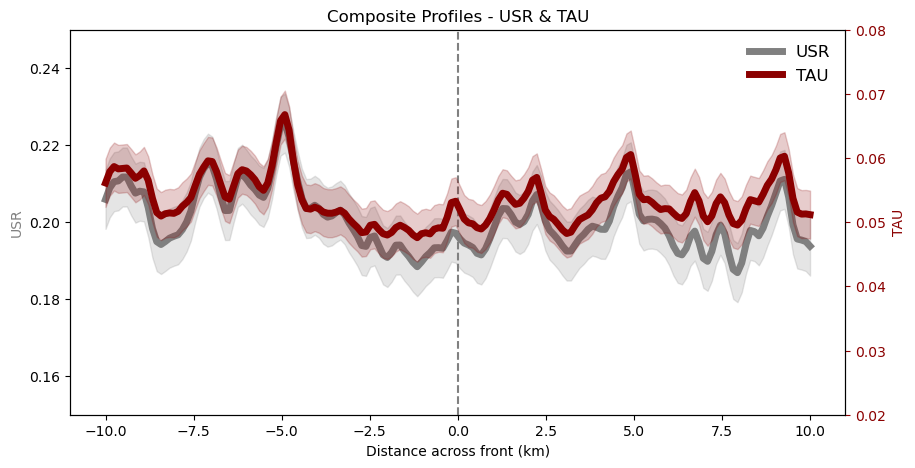

In [61]:
plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, 
                         var1='USR', var2='TAU', 
                         ylabel1='USR', ylabel2='TAU', 
                         smooth_window=1, ylim1=(0.15,0.25), ylim2=(0.02, 0.08),color1='gray',color2='darkred')

In [1]:
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='QL', ylabel='', smooth_window=2)

NameError: name 'plot_all_cases_composite' is not defined

In [2]:
data

NameError: name 'data' is not defined

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_38516/1945137719.py:35: RuntimeWarning: Mean of empty slice
  return series - np.nanmean(series)


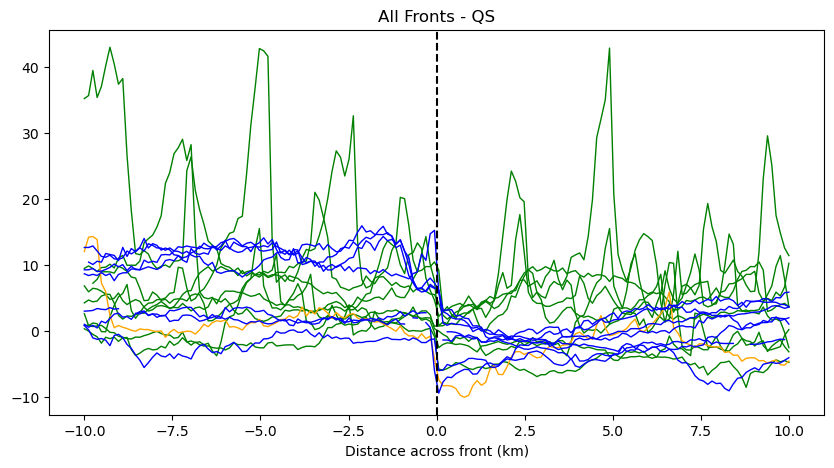

In [579]:
def plot_all_sections(padded_sections, frontinfo_df, var, ylabel):
    plt.figure(figsize=(10, 5))
    for i, sec in enumerate(padded_sections):
        front_year= frontinfo_df.iloc[i]['Mission']
        front_time=frontinfo_df.iloc[i]['time']
        front_lat=frontinfo_df.iloc[i]['lat']
        front_phase=frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        if var == 'chl':
            plot_var = zscore(sec[var])
        elif var == 'SW':
            plot_var = zscore(sec[var])
        else:
            plot_var = detrend(sec[var])
        
        plot_var = sec[var]
        plt.plot(dist_km, plot_var, linewidth=1,label=f'Front {i+1} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}', color=color)
        if var == 'temp':
            plt.ylim(-1.2,1.2)
        elif var == 'O2':
            plt.ylim(-10,10)
        elif var == 'O2_sat':
            plt.ylim(-5,5)
        
    plt.axvline(0, color='k', linestyle='--', label='Front Location')
    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    #plt.legend()
    plt.title(f'All Fronts - {var}')
    plt.show()


plot_all_sections(padded_sections, frontinfo_df, 'QS', '')

In [459]:
#xr.open_dataset('/Volumes/external/TIW/data/saildrone/processed_coare/TPOS2017Saildrone1005curf.cdf')

# repeat for carbon

In [6]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.stats import zscore
from scipy.signal import detrend

# Define colors for each mission year
year_colors = {
    2017: 'green',
    2018: 'orange',
    2019: 'blue',
    2021: 'black',
    2022: 'cyan',
    2023: 'brown',
    2024: 'hotpink'
}

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times.values)  # Ensure it's in datetime format
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)  # Convert seconds to time steps
    
    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)
    
    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def interpolate_section(section, target_dist_km):
    dist = np.cumsum(np.sqrt(np.diff(section['lat'], prepend=section['lat'][0])**2 + 
                              np.diff(section['lon'], prepend=section['lon'][0])**2)) * 111  # Approximate km conversion
    
    interp_section = {}
    for key in section:
        interp_section[key] = np.interp(target_dist_km, dist - dist[len(dist) // 2], section[key])
    
    return interp_section

def plot_all_sections(sections, frontinfo_df, vars_to_plot, ylabels,ylim):
    plt.figure(figsize=(10, 5))
    dist_km = np.linspace(-10, 10, 100)  # Uniform grid from -10 to +10 km
    all_var_values = {var: [] for var in vars_to_plot}  # Store values for computing composite lines
    
    for i, section in enumerate(sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        interp_section = interpolate_section(section, dist_km)
        
        # Ensure flipping is based on SST values
        valid_indices = np.where(~np.isnan(interp_section['SST (C)']))[0]
        if len(valid_indices) > 1:
            mid_idx = len(valid_indices) // 2
            if np.nanmean(interp_section['SST (C)'][valid_indices[:mid_idx]]) < np.nanmean(interp_section['SST (C)'][valid_indices[mid_idx:]]):
                dist_km = -dist_km[::-1]
                for key in interp_section:
                    interp_section[key] = interp_section[key][::-1]
        
        for var in vars_to_plot:
            plot_var = interp_section[var] #- np.nanmean(interp_section[var])
            all_var_values[var].append(plot_var)
            #plt.plot(dist_km, plot_var, linewidth=2, alpha=0.2, label=f'{var} - Front {i+1}', color=color)
    
    # Compute and plot composite lines
    for var, ylabel in zip(vars_to_plot, ylabels):
        composite_line = np.nanmean(all_var_values[var], axis=0)
        composite_var_smooth = gaussian_filter1d(composite_line, sigma=1)
        plt.plot(dist_km, composite_var_smooth, linewidth=5, label=f'{var}', zorder=5)
    
    # Plot vertical line for front location
    plt.axvline(0, color='gray', linestyle='--')#, label='Front Location')
    #plt.axhline(0, color='gray', linestyle='--')
    #plt.ylim(-ylim,ylim)
    
    # Labels, title, and legend
    plt.xlabel('Distance across front (km)', fontsize=14)
    plt.ylabel(', '.join(ylabels), fontsize=14)
    plt.title(f'All {len(sections)} Fronts')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend()
    plt.show()

# Load front information
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

sections = []
for idx, row in frontinfo_df.iterrows():
    year, sd, front_time = row['Mission'], row['SD'], row['time']
    file_path = f'/Volumes/external/TIW/data/saildrone/processed_carbon/{year}_SD{sd}_carbon_data.nc'
    
    try:
        data = xr.open_dataset(file_path)
        data = data.where(data != -999, np.nan)  # Replace -999 with NaN
        data['time'] = pd.to_datetime(data['time'].values)
        
        section = slice_around_front(data, front_time)
        if len(section['SST (C)']) > 0 and not np.all(np.isnan(section['SST (C)'])):
            sections.append(section)
        else:
            print(f"Skipping front {idx}: No valid data.")
    except Exception as e:
        print(f"Failed to process front {idx} in {file_path}: {e}")


Failed to process front 18 in /Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1069_carbon_data.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1069_carbon_data.nc'
Failed to process front 19 in /Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1069_carbon_data.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1069_carbon_data.nc'
Failed to process front 22 in /Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1068_carbon_data.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1068_carbon_data.nc'
Failed to process front 24 in /Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1068_carbon_data.nc: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/processed_carbon/2019_SD1068_carbon_data.nc'
Failed to process front 25 in /Volumes/external/TIW/data/saildrone/proce

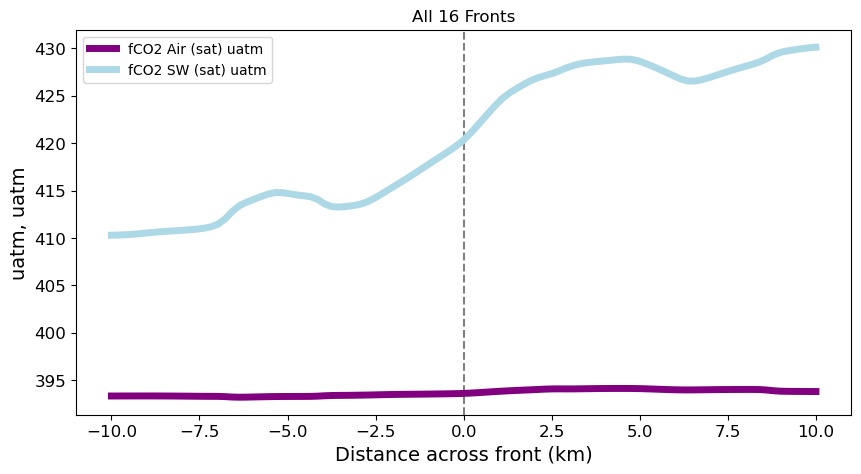

In [7]:
def plot_all_sections(sections, frontinfo_df, vars_to_plot, ylabels,ylim):
    plt.figure(figsize=(10, 5))
    dist_km = np.linspace(-10, 10, 100)  # Uniform grid from -10 to +10 km
    all_var_values = {var: [] for var in vars_to_plot}  # Store values for computing composite lines
    
    for i, section in enumerate(sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        interp_section = interpolate_section(section, dist_km)
        
        # Ensure flipping is based on SST values
        valid_indices = np.where(~np.isnan(interp_section['SST (C)']))[0]
        if len(valid_indices) > 1:
            mid_idx = len(valid_indices) // 2
            if np.nanmean(interp_section['SST (C)'][valid_indices[:mid_idx]]) < np.nanmean(interp_section['SST (C)'][valid_indices[mid_idx:]]):
                dist_km = -dist_km[::-1]
                for key in interp_section:
                    interp_section[key] = interp_section[key][::-1]
        
        for var in vars_to_plot:
            plot_var = interp_section[var] #- np.nanmean(interp_section[var])
            all_var_values[var].append(plot_var)
            #plt.plot(dist_km, plot_var, linewidth=2, alpha=0.2, label=f'{var} - Front {i+1}', color=color)
    
    # Compute and plot composite lines
    for var, ylabel in zip(vars_to_plot, ylabels):
        composite_line = np.nanmean(all_var_values[var], axis=0)
        composite_var_smooth = gaussian_filter1d(composite_line, sigma=1)
        if var == 'fCO2 Air (sat) uatm':
            plt.plot(dist_km, composite_var_smooth, linewidth=5, label=f'{var}', zorder=5,color='purple')
        if var == 'fCO2 SW (sat) uatm':
            plt.plot(dist_km, composite_var_smooth, linewidth=5, label=f'{var}', zorder=5,color='lightblue')
    
    # Plot vertical line for front location
    plt.axvline(0, color='gray', linestyle='--')#, label='Front Location')
    #plt.axhline(0, color='gray', linestyle='--')
    #plt.ylim(-ylim,ylim)
    
    # Labels, title, and legend
    plt.xlabel('Distance across front (km)', fontsize=14)
    plt.ylabel(', '.join(ylabels), fontsize=14)
    plt.title(f'All {len(sections)} Fronts')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend()
    plt.show()

plot_all_sections(sections, frontinfo_df, ['fCO2 Air (sat) uatm', 'fCO2 SW (sat) uatm'], ['uatm','uatm'],10)

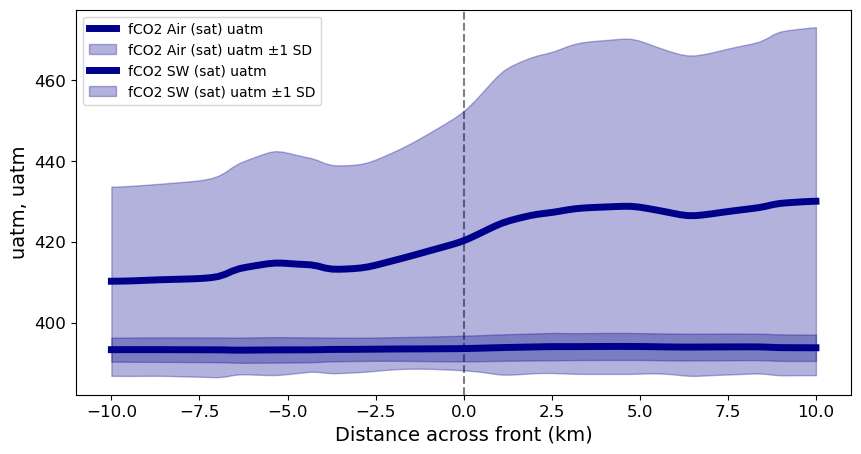

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_all_sections(sections, frontinfo_df, vars_to_plot, ylabels, ylim):
    plt.figure(figsize=(10, 5))
    dist_km = np.linspace(-10, 10, 100)  # Uniform grid from -10 to +10 km
    all_var_values = {var: [] for var in vars_to_plot}  # Store values for computing composite lines
    
    for i, section in enumerate(sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        interp_section = interpolate_section(section, dist_km)
        
        # Ensure flipping is based on SST values
        valid_indices = np.where(~np.isnan(interp_section['SST (C)']))[0]
        if len(valid_indices) > 1:
            mid_idx = len(valid_indices) // 2
            if np.nanmean(interp_section['SST (C)'][valid_indices[:mid_idx]]) < np.nanmean(interp_section['SST (C)'][valid_indices[mid_idx:]]):
                dist_km = -dist_km[::-1]
                for key in interp_section:
                    interp_section[key] = interp_section[key][::-1]
        
        for var in vars_to_plot:
            plot_var = interp_section[var]
            all_var_values[var].append(plot_var)
    
    for var, ylabel in zip(vars_to_plot, ylabels):
        var_stack = np.array(all_var_values[var])
        composite_line = np.nanmean(var_stack, axis=0)
        std_dev = np.nanstd(var_stack, axis=0)
        
        composite_var_smooth = gaussian_filter1d(composite_line, sigma=1)
        std_smooth = gaussian_filter1d(std_dev, sigma=1)

       # color = 'purple' if var == 'fCO2 Air (sat) uatm' else 'lightblue'
        color = 'darkblue'

        # Plot composite line
        plt.plot(dist_km, composite_var_smooth, linewidth=5, label=f'{var}', zorder=5, color=color)

        # Plot shaded error region
        plt.fill_between(dist_km,
                         composite_var_smooth - std_smooth,
                         composite_var_smooth + std_smooth,
                         color=color,
                         alpha=0.3,
                         zorder=4,
                         label=f'{var} ±1 SD')

    # Plot vertical line for front location
    plt.axvline(0, color='gray', linestyle='--')
    
    # Labels, title, and legend
    plt.xlabel('Distance across front (km)', fontsize=14)
    plt.ylabel(', '.join(ylabels), fontsize=14)
    #plt.title(f'All {len(sections)} Fronts')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    #plt.ylim(-ylim, ylim)
    plt.legend()
    plt.show()
plot_all_sections(sections, frontinfo_df, ['fCO2 Air (sat) uatm', 'fCO2 SW (sat) uatm'], ['uatm','uatm'],10)

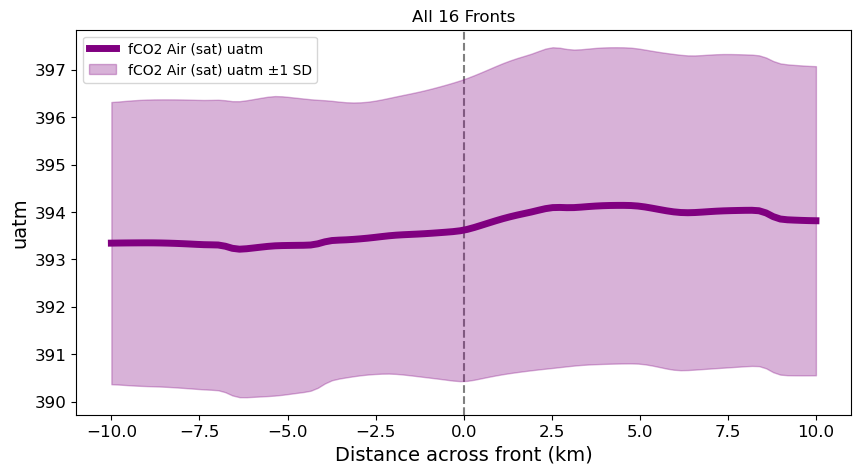

In [12]:
plot_all_sections(sections, frontinfo_df, ['fCO2 Air (sat) uatm'], ['uatm'],10)

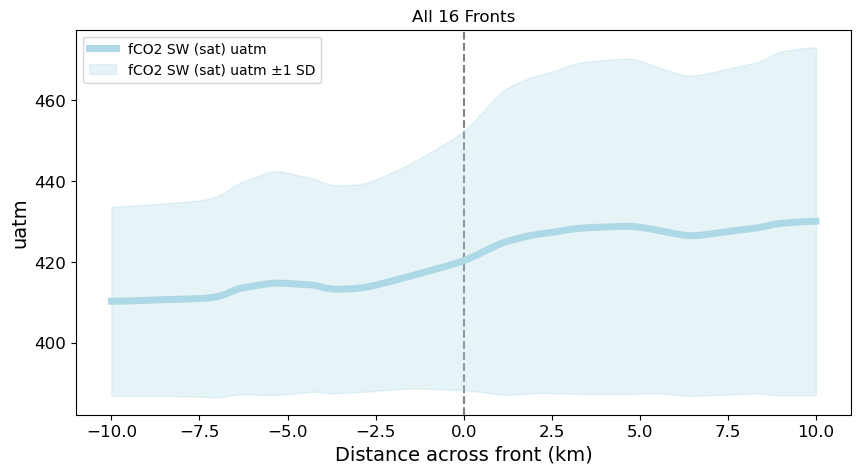

In [13]:
plot_all_sections(sections, frontinfo_df, ['fCO2 SW (sat) uatm'], ['uatm'],10)

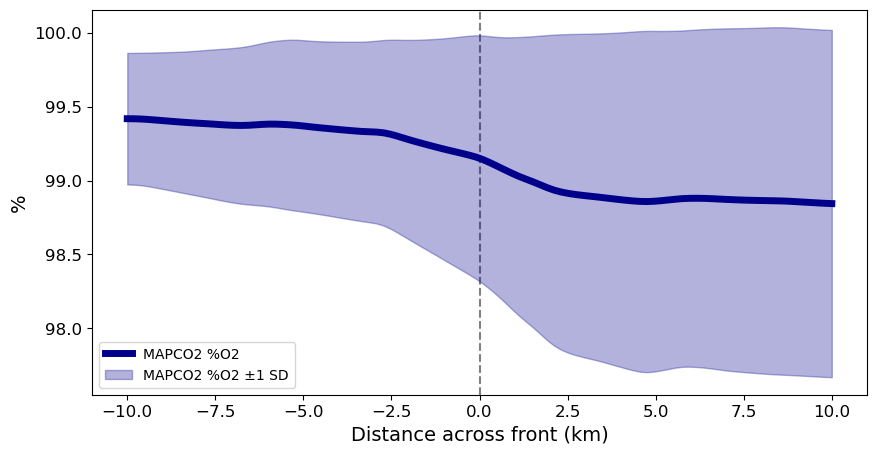

In [17]:
plot_all_sections(sections, frontinfo_df, ['MAPCO2 %O2'], ['%'],0.5)

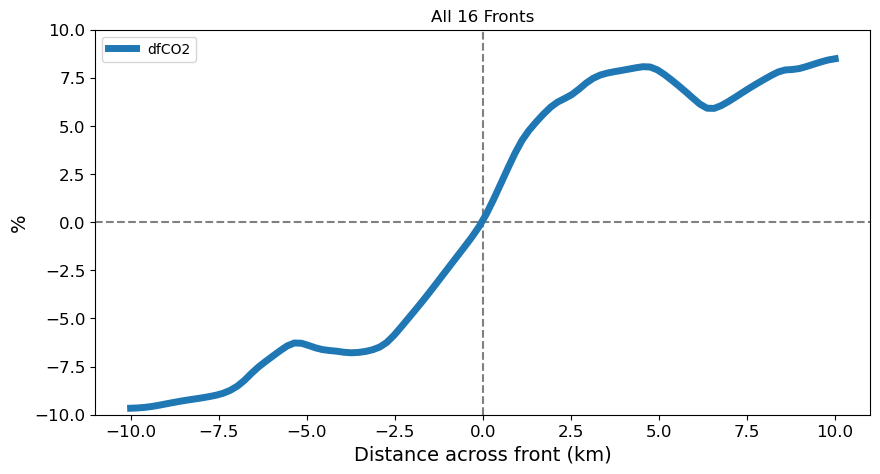

In [263]:
plot_all_sections(sections, frontinfo_df, ['dfCO2'], ['%'],10)

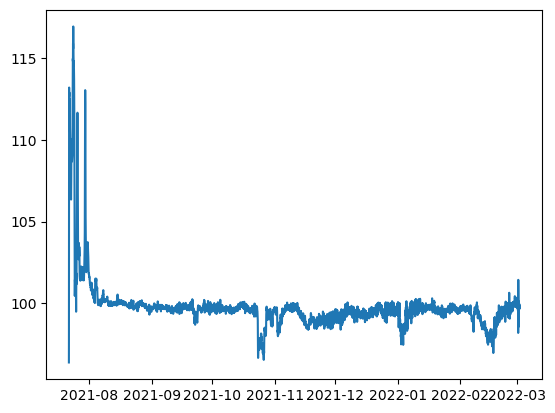

In [245]:
plt.plot(data['time'],data['MAPCO2 %O2'])

In [226]:
data

<xarray.Dataset> Size: 344kB
Dimensions:              (time: 5381)
Coordinates:
  * time                 (time) datetime64[ns] 43kB 2021-07-22T00:17:00 ... 2...
Data variables:
    SST (C)              (time) float64 43kB 14.29 14.21 14.03 ... nan nan nan
    fCO2 SW (sat) uatm   (time) float64 43kB 148.4 123.5 237.7 ... nan nan nan
    fCO2 Air (sat) uatm  (time) float64 43kB 400.0 403.1 403.9 ... nan nan nan
    dfCO2                (time) float64 43kB -251.6 -279.6 -166.2 ... nan nan
    MAPCO2 %O2           (time) float64 43kB 96.37 97.72 104.6 ... 99.89 99.73
    lat                  (time) float64 43kB 37.74 37.72 37.7 ... 7.544 7.551
    lon                  (time) float64 43kB -122.6 -122.6 ... -128.7 -128.7
Attributes:
    mission:  2021_SD1066

In [90]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Load front information
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
frontinfo_df = frontinfo_df[(frontinfo_df['manual_QC'] == 0)]
#frontinfo_df=frontinfo_df[frontinfo_df['phase']>np.pi]
#frontinfo_df=frontinfo_df[(frontinfo_df['lat']<4.5)&(frontinfo_df['lat']>1)]
frontinfo_df=frontinfo_df[(frontinfo_df['lat']<1)]
def read_sd_data(sd_path, miss_yr):
    ds = xr.open_dataset(sd_path)

    lat = ds['latitude'].values
    lon = ds['longitude'].values
    time = ds['time'].values

    if miss_yr in [2017, 2018]:
        temp = ds['TEMP_CTD_MEAN'].values
        sal = ds['SAL_MEAN'].values
    elif miss_yr == 2019:
        temp = ds['TEMP_CTD_RBR_MEAN'].values
        sal = ds['SAL_RBR_MEAN'].values
    elif miss_yr == 2021:
        sal = ds['SAL_SBE37_MEAN'].values
        if '1065' in sd_path:
            temp = ds['TEMP_DEPTH_HALFMETER_MEAN'].values
        elif '1066' in sd_path:
            temp = ds['TEMP_SBE37_MEAN'].values
    elif miss_yr in [2022, 2023, 2024]:
        temp = ds['TEMP_DEPTH_HALFMETER_MEAN'].values
        sal = ds['SAL_SBE37_MEAN'].values
    else:
        raise ValueError(f"Unsupported year: {miss_yr}")

    return lat, lon, time, temp, sal

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(lat, lon, temp, sal, time, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(time, front_time)

    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(time), front_index + time_window_indices)

    section = {
        'lat': lat[start_idx:end_idx],
        'lon': lon[start_idx:end_idx],
        'temp': temp[start_idx:end_idx],
        'sal': sal[start_idx:end_idx],
        'time': time[start_idx:end_idx]
    }

    return section

def orient_section(section):
    n_avg = min(3, len(section['temp']) // 4)  # Average over first/last ~10% of points if data is short
    start_temp = np.nanmean(section['temp'][:n_avg])
    end_temp = np.nanmean(section['temp'][-n_avg:])

    if start_temp < end_temp:
        for key in section:
            section[key] = section[key][::-1]

    return section

# Collect all sections
composite_sections = []

for idx, row in frontinfo_df.iterrows():
    Mission = row['Mission']
    SD = row['SD']
    front_time = row['time']
    year = Mission

    saildrone_path = f'/Volumes/external/TIW/data/saildrone/{Mission}/1min/TPOS-{Mission}_SD{SD}_1min.nc'

    try:
        lat, lon, time, temp, sal = read_sd_data(saildrone_path, year)

        section = slice_around_front(lat, lon, temp, sal, time, front_time)

        if len(section['temp']) > 0 and not np.all(np.isnan(section['temp'])):
            section = orient_section(section)
            composite_sections.append(section)
        else:
            print(f"Skipping front {idx} - no valid data")
    except Exception as e:
        print(f"Failed to process front {idx}: {e}")

# Pad all sections to the same length
max_len = max([len(sec['temp']) for sec in composite_sections])

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), 'constant', constant_values=np.nan)
    return section

padded_sections = [pad_section(sec, max_len) for sec in composite_sections]

# Calculate composite mean
composite_temp = np.nanmean([sec['temp'] for sec in padded_sections], axis=0)
composite_sal = np.nanmean([sec['sal'] for sec in padded_sections], axis=0)

# Distance axis (km)
dist_km = np.linspace(-10, 10, max_len)


Processing Front 19 | Mission: 2019 | SD: 1069 | Front Time: 9/10/19 6:17
Reading from file: /Volumes/external/TIW/data/saildrone/2019/1min/TPOS-2019_SD1069_1min.nc


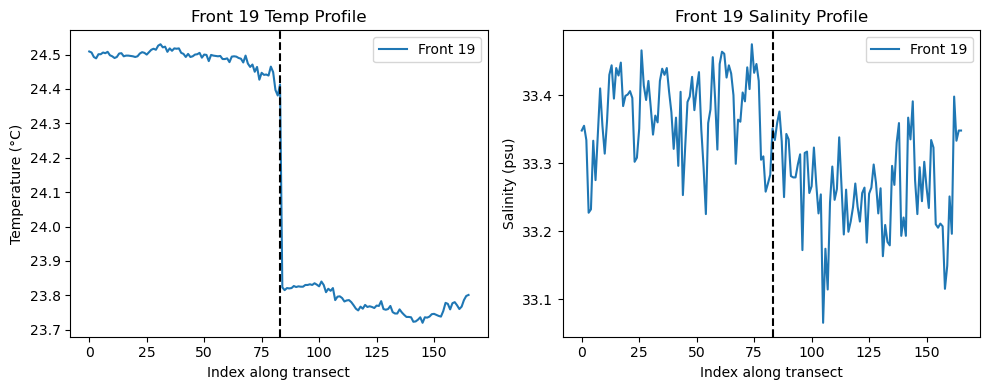

Processing Front 24 | Mission: 2019 | SD: 1068 | Front Time: 9/18/19 14:16
Reading from file: /Volumes/external/TIW/data/saildrone/2019/1min/TPOS-2019_SD1068_1min.nc


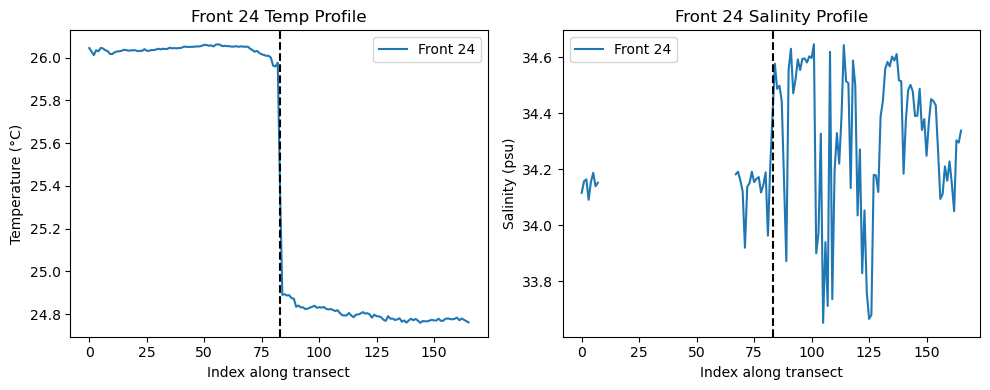

Processing Front 25 | Mission: 2019 | SD: 1068 | Front Time: 9/21/19 2:39
Reading from file: /Volumes/external/TIW/data/saildrone/2019/1min/TPOS-2019_SD1068_1min.nc


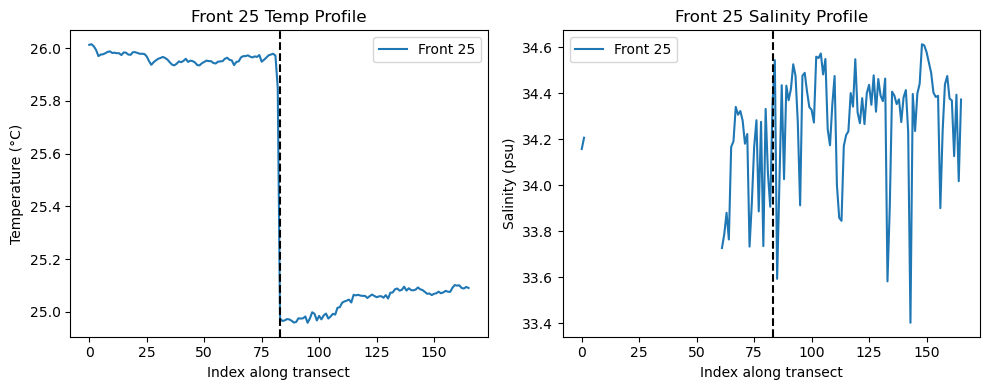

Processing Front 30 | Mission: 2019 | SD: 1067 | Front Time: 9/4/19 23:33
Reading from file: /Volumes/external/TIW/data/saildrone/2019/1min/TPOS-2019_SD1067_1min.nc


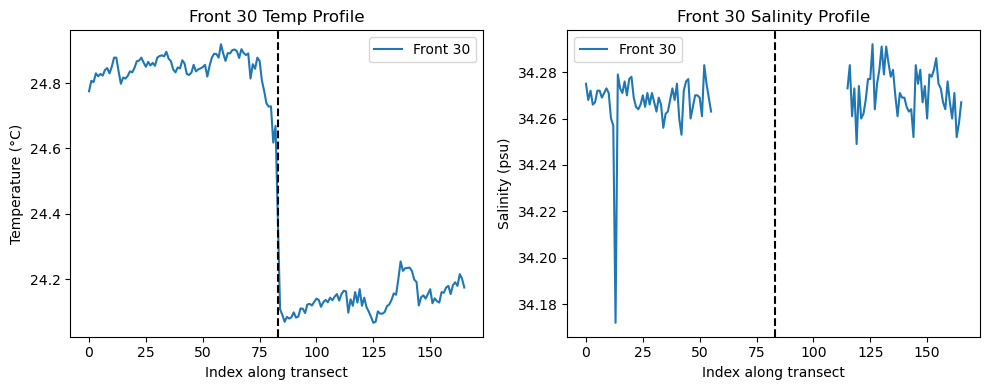

Number of valid front sections collected: 4


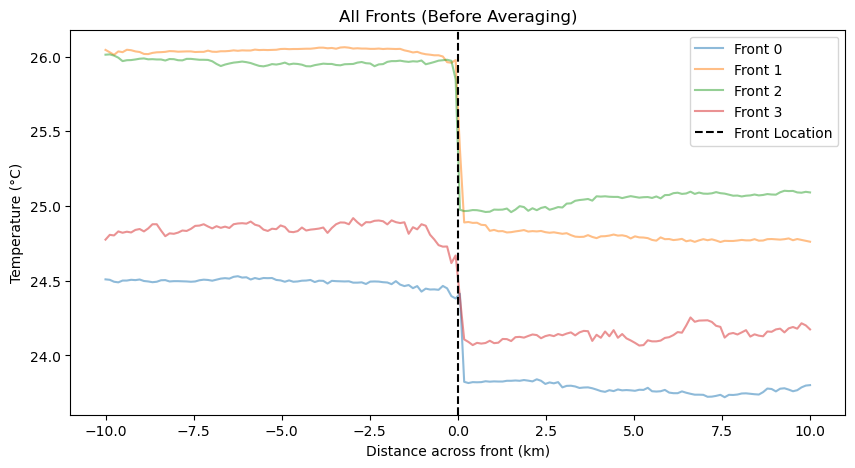

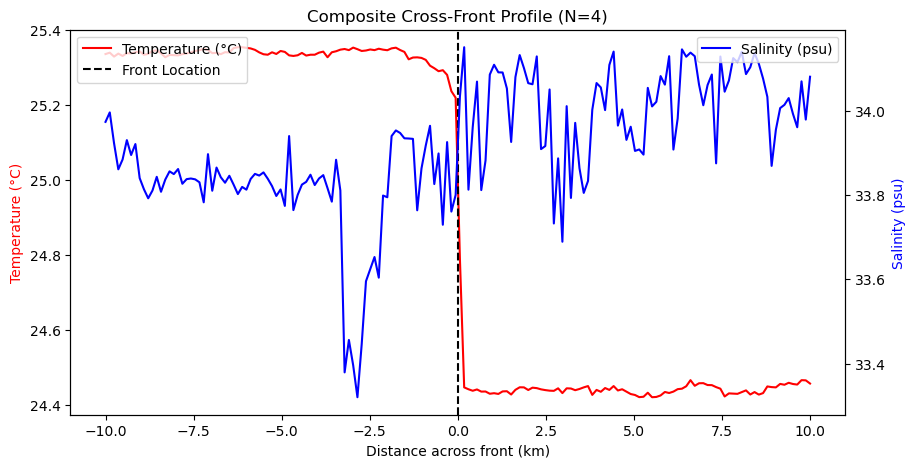

In [91]:
composite_sections = []

for idx, row in frontinfo_df.iterrows():
    Mission = row['Mission']
    SD = row['SD']
    front_time = row['time']
    year = Mission

    saildrone_path = f'/Volumes/external/TIW/data/saildrone/{Mission}/1min/TPOS-{Mission}_SD{SD}_1min.nc'

    print(f"Processing Front {idx} | Mission: {Mission} | SD: {SD} | Front Time: {front_time}")
    print(f"Reading from file: {saildrone_path}")

    try:
        lat, lon, time, temp, sal = read_sd_data(saildrone_path, year)

        section = slice_around_front(lat, lon, temp, sal, time, front_time)

        if len(section['temp']) > 0 and not np.all(np.isnan(section['temp'])):
            section = orient_section(section)
            composite_sections.append(section)

            # Plot each section individually
            plt.figure(figsize=(10, 4))

            plt.subplot(1, 2, 1)
            plt.plot(section['temp'], label=f'Front {idx}')
            plt.axvline(len(section['temp']) // 2, color='k', linestyle='--')
            plt.title(f'Front {idx} Temp Profile')
            plt.xlabel('Index along transect')
            plt.ylabel('Temperature (°C)')
            plt.legend()

            plt.subplot(1, 2, 2)
            plt.plot(section['sal'], label=f'Front {idx}')
            plt.axvline(len(section['sal']) // 2, color='k', linestyle='--')
            plt.title(f'Front {idx} Salinity Profile')
            plt.xlabel('Index along transect')
            plt.ylabel('Salinity (psu)')
            plt.legend()

            plt.tight_layout()
            plt.show()

        else:
            print(f"Skipping front {idx} - no valid data")
    except Exception as e:
        print(f"Failed to process front {idx}: {e}")

print(f"Number of valid front sections collected: {len(composite_sections)}")

if len(composite_sections) == 0:
    raise ValueError("No valid front sections found. Check data availability and time matching.")

# Pad and average
max_len = max([len(sec['temp']) for sec in composite_sections])
padded_sections = [pad_section(sec, max_len) for sec in composite_sections]
composite_temp = np.nanmean([sec['temp'] for sec in padded_sections], axis=0)
composite_sal = np.nanmean([sec['sal'] for sec in padded_sections], axis=0)

# Plot each profile with different color before averaging
dist_km = np.linspace(-10, 10, max_len)
plt.figure(figsize=(10, 5))
for i, sec in enumerate(padded_sections):
    plt.plot(dist_km, sec['temp'], label=f'Front {i}', alpha=0.5)

plt.axvline(0, color='k', linestyle='--', label='Front Location')
plt.xlabel('Distance across front (km)')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.title('All Fronts (Before Averaging)')
plt.show()

# Final composite plot
fig, ax1 = plt.subplots(figsize=(10, 5))
ax2 = ax1.twinx()

ax1.plot(dist_km, composite_temp, 'r-', label='Temperature (°C)')
ax2.plot(dist_km, composite_sal, 'b-', label='Salinity (psu)')

ax1.set_xlabel('Distance across front (km)')
ax1.set_ylabel('Temperature (°C)', color='r')
ax2.set_ylabel('Salinity (psu)', color='b')

ax1.axvline(0, color='k', linestyle='--', label='Front Location')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title(f'Composite Cross-Front Profile (N={len(composite_sections)})')
plt.show()


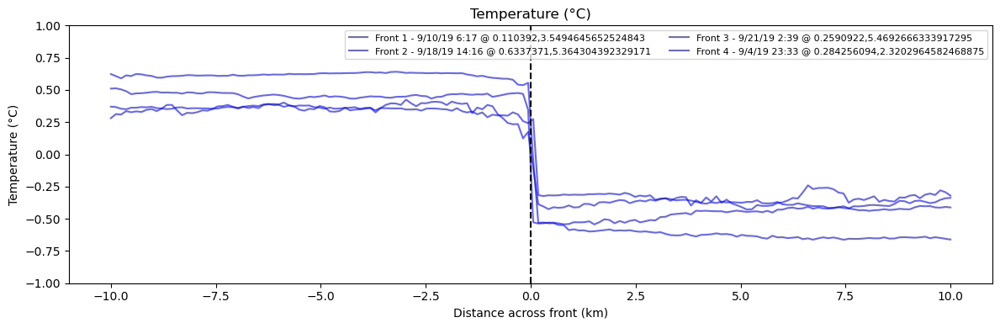

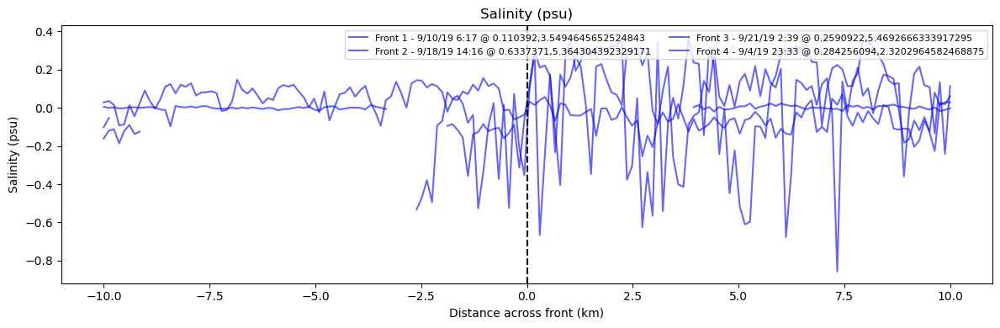

In [92]:
import matplotlib.pyplot as plt
import numpy as np

def detrend(series):
    return series - np.nanmean(series)

def plot_all_fronts_overlaid(composite_sections, frontinfo_df, var1='temp', var2='sal', title1='Temperature (°C)', title2='Salinity (psu)', ylabel1='Temperature (°C)', ylabel2='Salinity (psu)'):
    # Define a color map based on the year (Mission)
    year_colors = {
        2017: 'green',
        2018: 'orange',
        2019: 'blue',
        2021: 'purple',
        2022: 'red',
        2023: 'cyan',
        2024: 'magenta'
    }

    # Find the max length to standardize section lengths
    max_len = max(len(sec['temp']) for sec in composite_sections)

    # Create a distance axis centered on the front (x=0)
    dist_km = np.linspace(-10, 10, max_len)

    # Plot the first variable (e.g., temperature)
    plt.figure(figsize=(12, 4))
    for i, section in enumerate(composite_sections):
        # Get the Mission year from the frontinfo_df dataframe
        Mission = frontinfo_df.iloc[i]['Mission']
        year = Mission
        front_time=frontinfo_df.iloc[i]['time']
        front_lat=frontinfo_df.iloc[i]['lat']
        front_phase=frontinfo_df.iloc[i]['phase']

        # Select color based on year

        color = year_colors.get(year, 'gray')  # Default to 'gray' if year is not in the map

        # Pad section if it's shorter than max_len
        var1_data = np.full(max_len, np.nan)
        var2_data = np.full(max_len, np.nan)

        var1_data[:len(section[var1])] = section[var1]
        var2_data[:len(section[var2])] = section[var2]

        var1_data = detrend(var1_data)
        var2_data = detrend(var2_data)

        # Apply flipping logic if needed based on temperature
        if var1_data[0] < var1_data[-1]:  # Check if we need to flip based on temperature
            var1_data = var1_data[::-1]
            var2_data = var2_data[::-1]

        # Plot the first variable (temperature) with the selected color
        plt.plot(dist_km, var1_data, label=f'Front {i+1} - {front_time} @ {front_lat},{front_phase}', color=color, alpha=0.6)

    plt.axvline(0, color='k', linestyle='--')
    plt.title(title1)
    plt.ylabel(ylabel1)
    plt.ylim(-1,1)
    plt.xlabel('Distance across front (km)')
    plt.legend(loc='upper right', fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()

    # Plot the second variable (e.g., salinity)
    plt.figure(figsize=(12, 4))
    for i, section in enumerate(composite_sections):
        # Get the Mission year from the frontinfo_df dataframe
        Mission = frontinfo_df.iloc[i]['Mission']
        year = Mission
        front_time=frontinfo_df.iloc[i]['time']
        front_lat=frontinfo_df.iloc[i]['lat']
        front_phase=frontinfo_df.iloc[i]['phase']

        # Select color based on year
        color = year_colors.get(year, 'gray')  # Default to 'gray' if year is not in the map

        # Pad section if it's shorter than max_len
        var1_data = np.full(max_len, np.nan)
        var2_data = np.full(max_len, np.nan)

        var1_data[:len(section[var1])] = section[var1]
        var2_data[:len(section[var2])] = section[var2]

        var1_data = detrend(var1_data)
        var2_data = detrend(var2_data)

        # Apply flipping logic if needed based on temperature
        if var1_data[0] < var1_data[-1]:  # Check if we need to flip based on temperature
            var1_data = var1_data[::-1]
            var2_data = var2_data[::-1]

        # Plot the second variable (salinity) with the selected color
        plt.plot(dist_km, var2_data, label=f'Front {i+1} - {front_time} @ {front_lat},{front_phase}', color=color, alpha=0.6)

    plt.axvline(0, color='k', linestyle='--')
    plt.title(title2)
    plt.ylabel(ylabel2)
    plt.xlabel('Distance across front (km)')
    plt.legend(loc='upper right', fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()

# Example usage:
plot_all_fronts_overlaid(
    composite_sections, 
    frontinfo_df, 
    var1='temp', var2='sal', 
    title1='Temperature (°C)', title2='Salinity (psu)', 
    ylabel1='Temperature (°C)', ylabel2='Salinity (psu)'
)


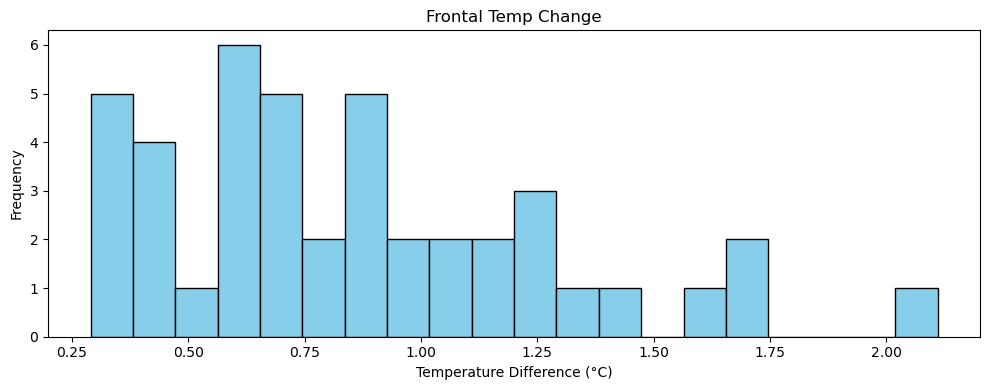

In [45]:
import matplotlib.pyplot as plt

def plot_temp_diff_histogram(frontinfo_df):
    plt.figure(figsize=(10, 4))
    plt.hist(frontinfo_df['temp_diff'].dropna(), bins=20, color='skyblue', edgecolor='black')
    plt.title('Frontal Temp Change')
    plt.xlabel('Temperature Difference (°C)')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_temp_diff_histogram(frontinfo_df)


# DC fluxes

In [733]:
xr.open_dataset('/Users/katiekohlman/Desktop/Saildrone/Data/SD-PMEL-TPOS-2019-01/dc/1069/tpos_2019_hf_20hz_1069_uvw_20190626_20191212_10min_fluxes_L2_relative_wind_direction.nc')

<xarray.Dataset> Size: 5MB
Dimensions:                 (time: 24479, n_bounds: 2)
Coordinates:
  * time                    (time) datetime64[ns] 196kB 2019-06-26T00:05:00 ....
  * n_bounds                (n_bounds) int32 8B 1 2
Data variables: (12/21)
    time_bounds             (time, n_bounds) datetime64[ns] 392kB ...
    taux                    (time) float64 196kB ...
    tauy                    (time) float64 196kB ...
    taux_count              (time) float64 196kB ...
    tauy_count              (time) float64 196kB ...
    taus                    (time) float64 196kB ...
    ...                      ...
    WWND                    (time) float64 196kB ...
    relative_wind_dir       (time) float64 196kB ...
    arctan_VoverU_relative  (time) float64 196kB ...
    WIND_SONICTEMP          (time) float64 196kB ...
    latitude                (time) float64 196kB ...
    longitude               (time) float64 196kB ...
Attributes:
    postprocessing_source_code:  L2_processing.py
    pp_creator_name:             Jack Reeves Eyre
    pp_date_created:             2021-10-18 13:35:17
    pp_description:              Direct covariance fluxes derived from Saildr...
    license:                     2019 (c) SAILDRONE Inc.  All Rights Reserved...
    original_title:              Saildrone TPOS 2019 High Resolution sd1069 d...

In [17]:
xr.open_dataset('/Volumes/external/TIW/data/saildrone/dc/2017_SD1005_dc.nc')

<xarray.Dataset> Size: 6MB
Dimensions:                 (time: 34415, n_bounds: 2)
Coordinates:
  * time                    (time) datetime64[ns] 275kB 2017-09-04T00:05:00 ....
  * n_bounds                (n_bounds) int32 8B 1 2
Data variables: (12/21)
    time_bounds             (time, n_bounds) datetime64[ns] 551kB ...
    taux                    (time) float64 275kB ...
    tauy                    (time) float64 275kB ...
    taux_count              (time) float64 275kB ...
    tauy_count              (time) float64 275kB ...
    taus                    (time) float64 275kB ...
    ...                      ...
    WWND                    (time) float64 275kB ...
    relative_wind_dir       (time) float64 275kB ...
    arctan_VoverU_relative  (time) float64 275kB ...
    WIND_SONICTEMP          (time) float64 275kB ...
    latitude                (time) float64 275kB ...
    longitude               (time) float64 275kB ...
Attributes:
    postprocessing_source_code:  L2_processing.py
    pp_creator_name:             Jack Reeves Eyre
    pp_date_created:             2021-10-15 17:02:48
    pp_description:              Direct covariance fluxes derived from Saildr...
    license:                     The data may be used and redistributed for f...
    original_title:              Saildrone TPOS 2017 High Resolution data - 10Hz

In [133]:
import pandas as pd
import numpy as np
import xarray as xr
from scipy.ndimage import gaussian_filter1d

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    # Compute the mean and standard deviation of the series
    mean = np.nanmean(series)
    std = np.nanstd(series)
    
    # Calculate the z-score for each data point
    return (series - mean) / std
    
# ---------------------------
# Load front information
# ---------------------------
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

all_composites = []
all_dist_km = []
case_names = []

cases = [6, 7, 8,1]
cases = [1]
for case in cases:

    if case == 1: 
        case_df = frontinfo_df#[frontinfo_df['idx'] ==138328]
        case_nm = 'ALL'
        print(len(case_df))
    else:
        continue

    # Collect and process all sections for this case...
    sections = []
    for idx, row in case_df.iterrows():
        year, sd, front_time = row['Mission'], row['SD'], row['time']

        try:
            data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/dc/{year}_SD{sd}_dc.nc').sel(n_bounds=1)
            data['tau_mag'] = np.sqrt(data['taux']**2+data['tauy']**2)
            data['wnd_spd'] = np.sqrt(data['UWND']**2+data['VWND']**2)
            section = slice_around_front(data, front_time)
            if row['flip'] == False:
                section = {key: section[key][::-1] for key in section}  # Flip if specified in 'flip' column
                sections.append(section)
            else:
                sections.append(section)
        except Exception as e:
            print(f"Failed to process front {idx}: {e}")

    if not sections:
        raise ValueError(f"No valid front sections found for case {case_nm}.")

    # Pad and compute composite
    max_len = max(len(sec['taux']) for sec in sections)
    padded_sections = [pad_section(sec, max_len) for sec in sections]

    dist_km = np.linspace(-10, 10, max_len)

    composite = {}

    
    # Filter and detrend 'chl' before computing the composite
    from scipy.signal import detrend
    from scipy.ndimage import gaussian_filter1d
    
    smooth_sigma = 1  # Approximate equivalent to a window size of 3
    
    # Filter, detrend, and smooth 'chl' before computing the composite
    for key in padded_sections[0]:
        if key not in ['time', 'time_bounds']:  # Ensure we don't attempt to average datetime values
            composite[key] = np.nanmean([sec[key] for sec in padded_sections], axis=0)



    # Store this case's composite and distance
    all_composites.append(composite)
    all_dist_km.append(dist_km)
    case_names.append(case_nm)

import numpy as np
import matplotlib.pyplot as plt

def plot_all_sections(padded_sections, frontinfo_df, var, ylabel):
    plt.figure(figsize=(10, 5))
    all_var_values = []  # To store values for computing the composite line
    
    for i, sec in enumerate(padded_sections):
        front_year = frontinfo_df.iloc[i]['Mission']
        front_time = frontinfo_df.iloc[i]['time']
        front_lat = frontinfo_df.iloc[i]['lat']
        front_phase = frontinfo_df.iloc[i]['phase']
        color = year_colors.get(front_year, 'gray') 
        
        plot_var = sec[var]


        # Store the data for the composite line
        all_var_values.append(plot_var)

        # Plot individual front sections
        plt.plot(dist_km, plot_var, linewidth=2, alpha=1,
                 label=f'Front {i+1} - {front_time} @ {round(front_lat,1)},{round(front_phase,1)}',
                 color=color)
        
        #plt.ylim(-1.2, 1.2)

    # Convert list to NumPy array for proper indexing
    all_var_values = np.array(all_var_values)  # Now it's shape (42, 166)

    # Compute and plot histogram of frontal changes
    plt.figure(figsize=(10, 5))
    changes = all_var_values[:, 165] - all_var_values[:, 0]  # Difference between first and last columns
    plt.hist(np.abs(changes), bins=30, color='gray', edgecolor='black', alpha=0.7)
    plt.xlabel(f'Change in {var}')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {var} Changes Across Fronts')
    plt.show()

42
Failed to process front 8: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2018_SD1029_dc.nc'
Failed to process front 18: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1065_dc.nc'
Failed to process front 19: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1065_dc.nc'
Failed to process front 20: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1065_dc.nc'
Failed to process front 21: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1066_dc.nc'
Failed to process front 22: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1066_dc.nc'
Failed to process front 23: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1066_dc.nc'
Failed to process front 24: [Errno 2] No such file or directory: '/Volumes/external/TIW/data/saildrone/dc/2021_SD1066_dc.nc

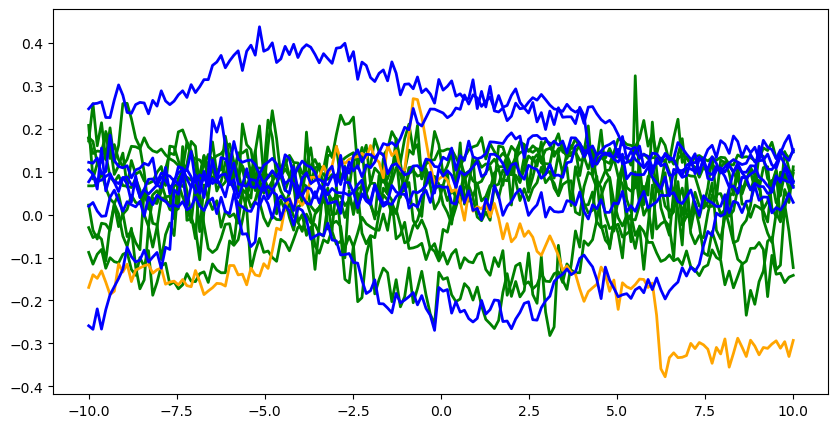

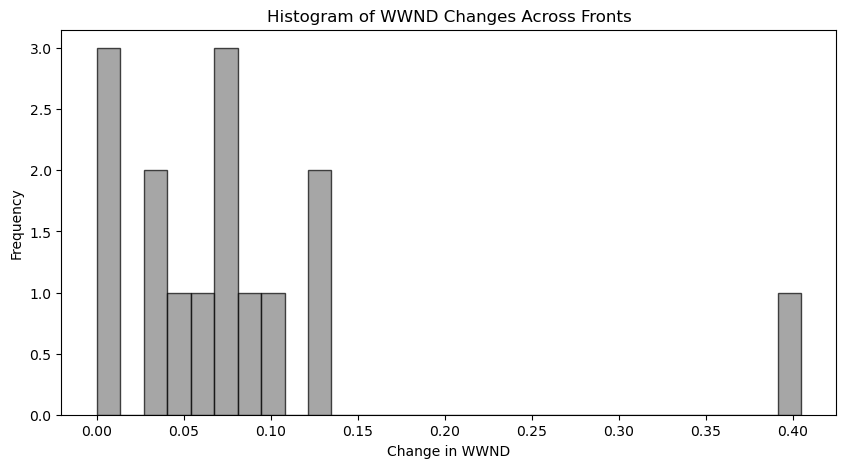

In [142]:
plot_all_sections(padded_sections, frontinfo_df, 'WWND', ' ')

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_59698/3668022901.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


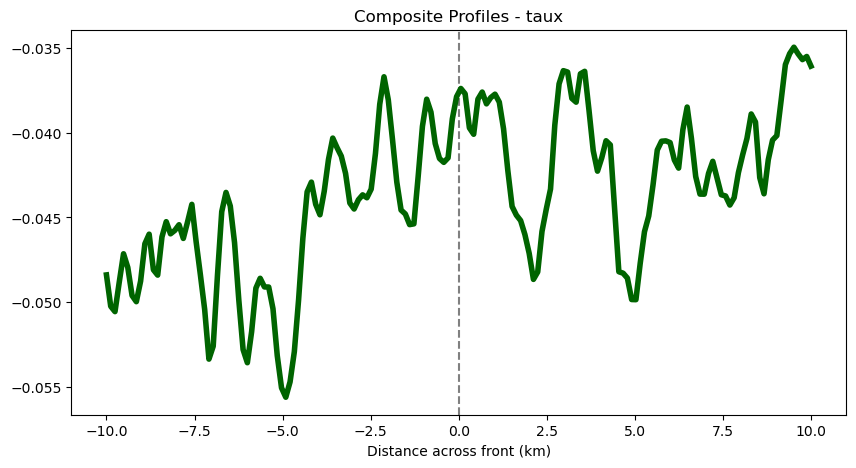

In [135]:
# plot function: 
#plt.figure(figsize=(10, 5))
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1):

    plt.figure(figsize=(10, 5))
    # Define distinct colors for each case
    plt.axvline(0, color='gray', linestyle='--')
    #plt.axhline(0, color='gray', linestyle='--')

    for i, composite in enumerate(all_composites):
        color='black'
            
        dist_km = all_dist_km[i]
          
        composite_var = composite[var]

        # Apply smoothing (Gaussian filter)
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)
        #composite_var_smooth = detrend(composite_var_smooth)
        # Plot with color and label
        plt.plot(dist_km, composite_var_smooth, color='darkgreen', 
                 linewidth=4)#, label=case_names[i])

    # Front location line


    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)


    
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='taux', ylabel='', smooth_window=1)

#plt.show()

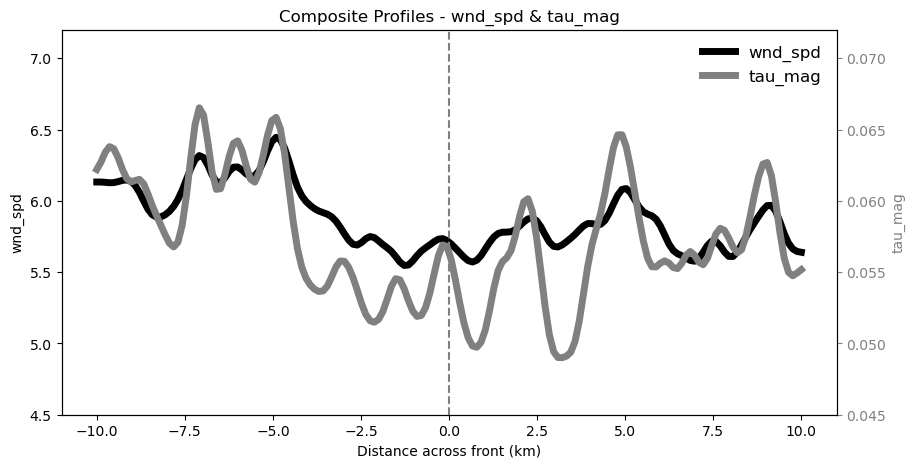

In [140]:
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, var1, var2, ylabel1, ylabel2, 
                             smooth_window=1, ylim1=None, ylim2=None):

    fig, ax1 = plt.subplots(figsize=(10, 5))

    ax2 = ax1.twinx()  # Create a second y-axis

    for i, composite in enumerate(all_composites):
        color1 = 'black'  # Color for var1
        color2 = 'gray'    # Color for var2
        
        dist_km = all_dist_km[i]

        # Apply smoothing
        composite_var1_smooth = gaussian_filter1d(composite[var1], sigma=smooth_window)
        composite_var2_smooth = gaussian_filter1d(composite[var2], sigma=smooth_window)

        # Plot var1 on primary axis
        ax1.plot(dist_km, composite_var1_smooth, color=color1, linewidth=5, label=f'{var1}')

        # Plot var2 on secondary axis
        ax2.plot(dist_km, composite_var2_smooth, color=color2, linewidth=5, label=f'{var2}')

    # Front location line
    ax1.axvline(0, color='gray', linestyle='--', zorder=5)

    # Axis labels and title
    ax1.set_xlabel('Distance across front (km)')
    ax1.set_ylabel(ylabel1, color='black')
    ax2.set_ylabel(ylabel2, color='gray')
    ax2.tick_params(axis='y', colors='gray')

    # Apply user-defined limits
    if ylim1:
        ax1.set_ylim(ylim1)
    if ylim2:
        ax2.set_ylim(ylim2)

    ax1.set_title(f'Composite Profiles - {var1} & {var2}')

    # Combine legends from both axes
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize='large', frameon=False)

    plt.show()

# Example call:
plot_all_cases_composite_2vars(all_composites, all_dist_km, case_names, 
                         var1='wnd_spd', var2='tau_mag', 
                         ylabel1='wnd_spd', ylabel2='tau_mag', 
                         smooth_window=2, ylim1=(4.5, 7.2), ylim2=(0.045,.072))


/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_59698/3668022901.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', frameon=False)


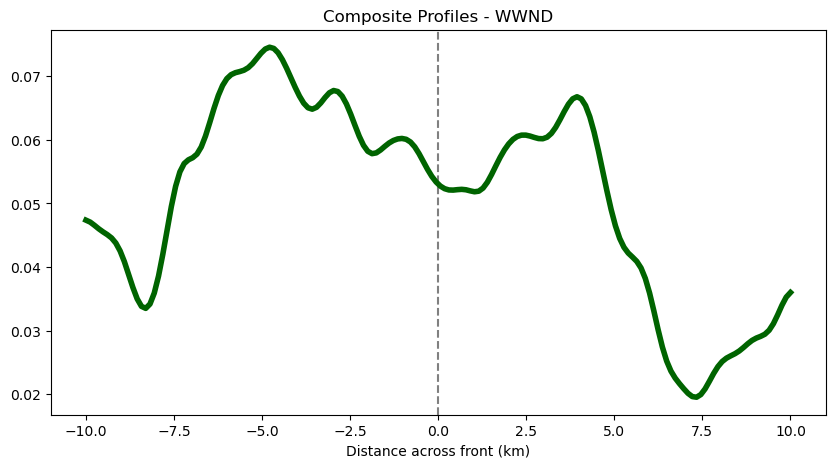

In [141]:
plot_all_cases_composite(all_composites, all_dist_km, case_names, var='WWND', ylabel='', smooth_window=3)

In [83]:
data = xr.open_dataset(f'/Volumes/external/TIW/data/saildrone/dc/{2017}_SD{1005}_dc.nc').sel(n_bounds=1)
data['tau_speed'] = np.sqrt(data['taux']**2+data['tauy']**2)
data

<xarray.Dataset> Size: 6MB
Dimensions:                 (time: 34415)
Coordinates:
  * time                    (time) datetime64[ns] 275kB 2017-09-04T00:05:00 ....
    n_bounds                int32 4B 1
Data variables: (12/22)
    time_bounds             (time) datetime64[ns] 275kB ...
    taux                    (time) float64 275kB 0.0144 0.01781 ... 0.2869
    tauy                    (time) float64 275kB 0.02715 0.01189 ... -0.2126
    taux_count              (time) float64 275kB ...
    tauy_count              (time) float64 275kB ...
    taus                    (time) float64 275kB ...
    ...                      ...
    relative_wind_dir       (time) float64 275kB ...
    arctan_VoverU_relative  (time) float64 275kB ...
    WIND_SONICTEMP          (time) float64 275kB ...
    latitude                (time) float64 275kB ...
    longitude               (time) float64 275kB ...
    tau_speed               (time) float64 275kB 0.03073 0.02141 ... 0.3571
Attributes:
    postprocessing_source_code:  L2_processing.py
    pp_creator_name:             Jack Reeves Eyre
    pp_date_created:             2021-10-15 17:02:48
    pp_description:              Direct covariance fluxes derived from Saildr...
    license:                     The data may be used and redistributed for f...
    original_title:              Saildrone TPOS 2017 High Resolution data - 10Hz

In [37]:
xr.open_dataset('/Volumes/external/TIW/data/saildrone/dc/2017_SD1005_dc.nc').squeeze()

<xarray.Dataset> Size: 6MB
Dimensions:                 (time: 34415, n_bounds: 2)
Coordinates:
  * time                    (time) datetime64[ns] 275kB 2017-09-04T00:05:00 ....
  * n_bounds                (n_bounds) int32 8B 1 2
Data variables: (12/21)
    time_bounds             (time, n_bounds) datetime64[ns] 551kB ...
    taux                    (time) float64 275kB ...
    tauy                    (time) float64 275kB ...
    taux_count              (time) float64 275kB ...
    tauy_count              (time) float64 275kB ...
    taus                    (time) float64 275kB ...
    ...                      ...
    WWND                    (time) float64 275kB ...
    relative_wind_dir       (time) float64 275kB ...
    arctan_VoverU_relative  (time) float64 275kB ...
    WIND_SONICTEMP          (time) float64 275kB ...
    latitude                (time) float64 275kB ...
    longitude               (time) float64 275kB ...
Attributes:
    postprocessing_source_code:  L2_processing.py
    pp_creator_name:             Jack Reeves Eyre
    pp_date_created:             2021-10-15 17:02:48
    pp_description:              Direct covariance fluxes derived from Saildr...
    license:                     The data may be used and redistributed for f...
    original_title:              Saildrone TPOS 2017 High Resolution data - 10Hz

# repeat for current data

# adcp data

File /Volumes/external/TIW/data/saildrone/processed_adcp/2023_SD1079_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...


/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/1397827908.py:125: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


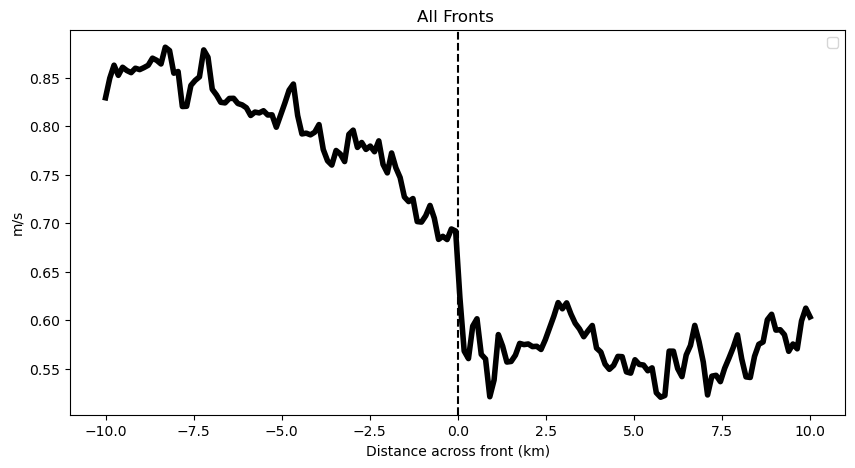

In [397]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from datetime import timedelta
import os  # Import os for file existence check

# Function Definitions (using your provided functions)

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    mean = np.nanmean(series)
    std = np.nanstd(series)
    return (series - mean) / std

# Smooth Composite Function
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1):
    plt.figure(figsize=(10, 5))
    
    for i, composite in enumerate(all_composites):
        color = 'black'
        dist_km = all_dist_km[i]
        composite_var = composite[var]
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)

        plt.plot(dist_km, composite_var_smooth, color=color, linewidth=4)

    plt.axvline(0, color='gray', linestyle='--', zorder=5)
    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)
    plt.show()

# Main Code to Process Data
# Load the front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]  # Filter QC-checked fronts

plt.figure(figsize=(10, 5))
all_curr_spd_composites = []  # To store current speed composites for all fronts
for i in range(0, len(frontinfo_df)):
    mission = frontinfo_df['Mission'][i]
    sd = frontinfo_df['SD'][i]
    front_time = frontinfo_df['time'][i]
    
    # Construct file path for ADCP dataset
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    
    # Skip if the file doesn't exist
    if not os.path.exists(adcp_file):
        print(f"File {adcp_file} does not exist. Skipping...")
        continue
    
    # Load ADCP dataset
    adcp_ds = xr.open_dataset(adcp_file)
    adcp_ds = adcp_ds.sel(depth=slice(0, 10)).mean(dim='depth')  # Surface focus
    adcp_ds['U'] = adcp_ds['U']/100
    adcp_ds['V'] = adcp_ds['V']/100
    
    # Prepare data for extraction
    adcp_data = {
        'time': adcp_ds['time'].values,
        'U': adcp_ds['U'].values,
        'V': adcp_ds['V'].values
    }
    
    # Slice data around the front time
    section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)
    
    # Flip if frontinfo_df['flip'] == False
    if frontinfo_df['flip'][i] == False:
        section['U'] = section['U'][::-1]
        section['V'] = section['V'][::-1]
    
    # Pad the section if needed (if the length differs)
    max_len = max(len(section['U']) for section in [section])  # Use the maximum length
    section = pad_section(section, max_len)
    
    # Calculate current speed
    curr_spd = np.sqrt(section['U']**2 + section['V']**2)

    # Store the current speed composite if it's above a threshold
    if np.nanmean(curr_spd) > 0.1:  # Assuming 10 m/s is the threshold
        all_curr_spd_composites.append(curr_spd)
    
    # Plot the current speed for the individual front
    all_dist_km = np.linspace(-10, 10, len(section['time']))  # Assuming 10 km window on each side
    #plt.plot(all_dist_km, curr_spd, label=f'Front {i+1}')
    
# Calculate the composite current speed (average of all valid fronts)
if all_curr_spd_composites:
    composite_curr_spd = np.nanmean(all_curr_spd_composites, axis=0)
    plt.plot(all_dist_km, composite_curr_spd, color='black', linewidth=4)

plt.axvline(0, color='k', linestyle='--')
plt.xlabel('Distance across front (km)')
plt.ylabel('m/s')
plt.legend()
plt.title(f'All Fronts ')
plt.show()


File /Volumes/external/TIW/data/saildrone/processed_adcp/2023_SD1079_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1033_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...
File /Volumes/external/TIW/data/saildrone/processed_adcp/2024_SD1090_adcp_10min.nc does not exist. Skipping...


<Figure size 1000x500 with 0 Axes>

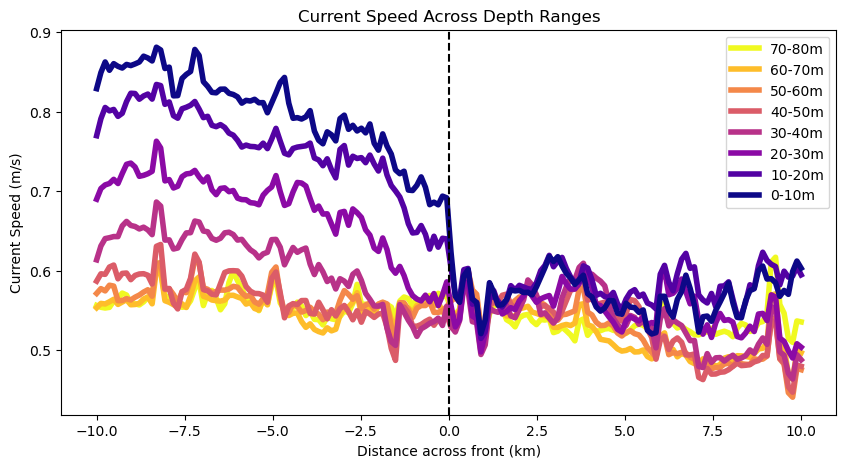

In [413]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from datetime import timedelta
import os  # Import os for file existence check

# Function Definitions (using your provided functions)

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def pad_section(section, max_len):
    for key in section:
        section[key] = np.pad(section[key], (0, max_len - len(section[key])), constant_values=np.nan)
    return section

def detrend(series):
    return series - np.nanmean(series)

def zscore(series):
    mean = np.nanmean(series)
    std = np.nanstd(series)
    return (series - mean) / std

# Smooth Composite Function
def plot_all_cases_composite(all_composites, all_dist_km, case_names, var, ylabel, smooth_window=1):
    plt.figure(figsize=(10, 5))
    
    for i, composite in enumerate(all_composites):
        color = 'black'  # Default color, but will change later for different depths
        dist_km = all_dist_km[i]
        composite_var = composite[var]
        composite_var_smooth = gaussian_filter1d(composite_var, sigma=smooth_window)

        plt.plot(dist_km, composite_var_smooth, label=case_names[i], linewidth=4)

    plt.axvline(0, color='gray', linestyle='--', zorder=5)
    plt.xlabel('Distance across front (km)')
    plt.ylabel(ylabel)
    plt.title(f'Composite Profiles - {var}')
    plt.legend(loc='upper right', fontsize='small', frameon=False)
    plt.show()

# Main Code to Process Data
# Load the front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]  # Filter QC-checked fronts

plt.figure(figsize=(10, 5))
all_curr_spd_composites = []  # To store current speed composites for all fronts

# Update Depth Range Composites and Names
depth_range_composites = {
    '0-10m': [], '10-20m': [], '20-30m': [], '30-40m': [], 
    '40-50m': [], '50-60m': [], '60-70m': [], '70-80m': []
}  # To store composites for each depth range

depth_range_names = ['0-10m', '10-20m', '20-30m', '30-40m', '40-50m', '50-60m', '60-70m', '70-80m']

# Depth ranges to loop through
depth_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80)]

# Use the 'spring' colormap to match the green-to-pink color range
cmap = plt.cm.plasma
colors = [cmap(i / (len(depth_range_names) - 1)) for i in range(len(depth_range_names))]

for i in range(0, len(frontinfo_df)):
    mission = frontinfo_df['Mission'][i]
    sd = frontinfo_df['SD'][i]
    front_time = frontinfo_df['time'][i]
    
    # Construct file path for ADCP dataset
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    
    # Skip if the file doesn't exist
    if not os.path.exists(adcp_file):
        print(f"File {adcp_file} does not exist. Skipping...")
        continue
    
    # Load ADCP dataset
    adcp_ds = xr.open_dataset(adcp_file)

    for depth_range, depth_name in zip(depth_ranges, depth_range_names):
        depth_start, depth_end = depth_range
        # Slice the data based on the depth range
        adcp_ds_depth = adcp_ds.sel(depth=slice(depth_start, depth_end)).mean(dim='depth')
        adcp_ds_depth['U'] = adcp_ds_depth['U'] / 100
        adcp_ds_depth['V'] = adcp_ds_depth['V'] / 100
        
        # Prepare data for extraction
        adcp_data = {
            'time': adcp_ds_depth['time'].values,
            'U': adcp_ds_depth['U'].values,
            'V': adcp_ds_depth['V'].values
        }

        # Slice data around the front time
        section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)

        # Flip if frontinfo_df['flip'] == False
        if frontinfo_df['flip'][i] == False:
            section['U'] = section['U'][::-1]
            section['V'] = section['V'][::-1]

        # Pad the section if needed (if the length differs)
        max_len = max(len(section['U']) for section in [section])  # Use the maximum length
        section = pad_section(section, max_len)

        # Calculate current speed
        curr_spd = np.sqrt(section['U']**2 + section['V']**2)

        # Store the current speed composite if it's above a threshold
        if np.nanmean(curr_spd) > 0.1:  # Assuming 0.1 m/s is the threshold
            depth_range_composites[depth_name].append(curr_spd)

        # Plot the current speed for the individual front
        all_dist_km = np.linspace(-10, 10, len(section['time']))  # Assuming 10 km window on each side
        #plt.plot(all_dist_km, curr_spd, label=f'Front {i+1}')

# Plot all depth range composites with colors from the 'spring' colormap
plt.figure(figsize=(10, 5))
for idx, depth_name in reversed(list(enumerate(depth_range_names))):  # Reverse to plot deeper first
    if depth_range_composites[depth_name]:
        composite_curr_spd = np.nanmean(depth_range_composites[depth_name], axis=0)
        plt.plot(all_dist_km, composite_curr_spd, label=f'{depth_name}', color=colors[idx], linewidth=4)

plt.axvline(0, color='k', linestyle='--')
plt.xlabel('Distance across front (km)')
plt.ylabel('Current Speed (m/s)')
plt.legend()
plt.title(f'Current Speed Across Depth Ranges')
plt.show()


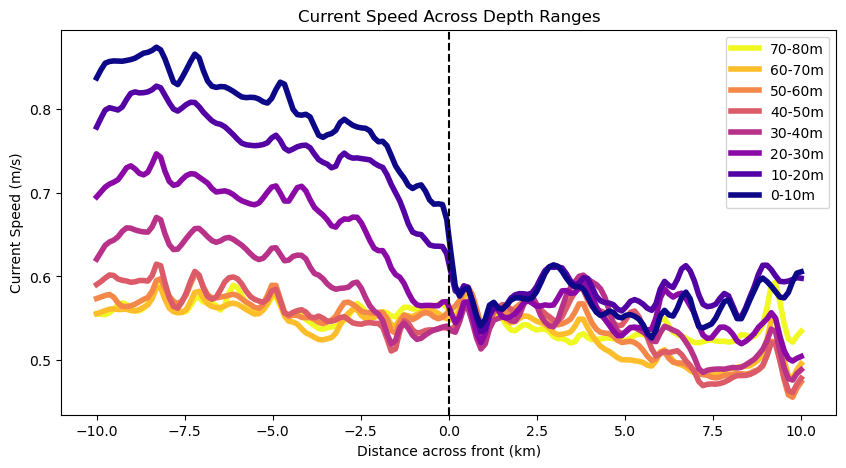

In [416]:
# Plot all depth range composites with colors from the 'spring' colormap
plt.figure(figsize=(10, 5))
for idx, depth_name in reversed(list(enumerate(depth_range_names))):  # Reverse to plot deeper first
    if depth_range_composites[depth_name]:
        # Calculate the composite of current speed
        composite_curr_spd = np.nanmean(depth_range_composites[depth_name], axis=0)
        
        # Apply Gaussian smoothing with a window size of 2
        composite_curr_spd_smooth = gaussian_filter1d(composite_curr_spd, sigma=1)
        
        # Plot the smoothed composite
        plt.plot(all_dist_km, composite_curr_spd_smooth, label=f'{depth_name}', color=colors[idx], linewidth=4)

plt.axvline(0, color='k', linestyle='--')
plt.xlabel('Distance across front (km)')
plt.ylabel('Current Speed (m/s)')
plt.legend()
plt.title(f'Current Speed Across Depth Ranges')
plt.show()


/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2611664208.py:78: RuntimeWarning: Mean of empty slice
  mean_curr_spd = np.array([np.nanmean(depth_range_composites[name], axis=0) for name in depth_names])


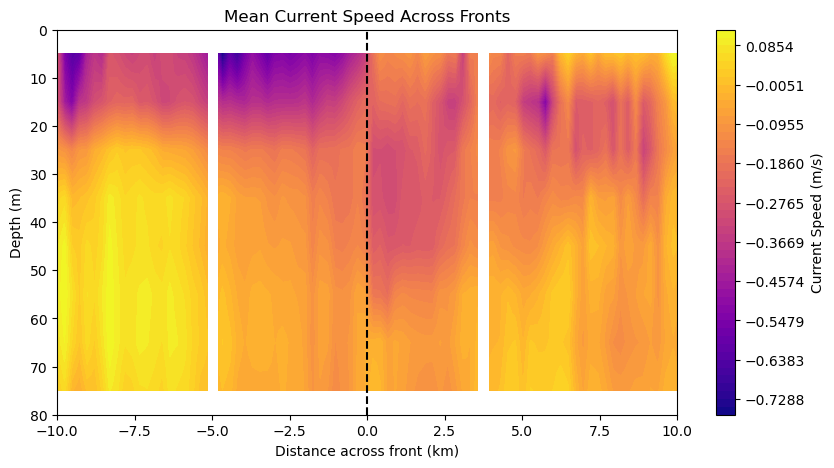

In [723]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
import os  # Import os for file existence check

# Function Definitions
def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

# Load the front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]  # Filter QC-checked fronts

# Depth ranges
depth_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80)]
depth_names = ['0-10m', '10-20m', '20-30m', '30-40m', '40-50m', '50-60m', '60-70m', '70-80m']
depths = np.array([np.mean(d) for d in depth_ranges])  # Mid-depth for each range

# Initialize storage for current speed profiles at different depths
depth_range_composites = {name: [] for name in depth_names}

for i in range(3,4):#len(frontinfo_df)):
    mission = frontinfo_df['Mission'].iloc[i]
    sd = frontinfo_df['SD'].iloc[i]
    front_time = frontinfo_df['time'].iloc[i]
    
    # Construct file path for ADCP dataset
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    
    if not os.path.exists(adcp_file):
        print(f"File {adcp_file} does not exist. Skipping...")
        continue
    
    adcp_ds = xr.open_dataset(adcp_file)

    for depth_range, depth_name in zip(depth_ranges, depth_names):
        depth_start, depth_end = depth_range
        adcp_ds_depth = adcp_ds.sel(depth=slice(depth_start, depth_end)).mean(dim='depth')
        adcp_ds_depth['U'] = adcp_ds_depth['U'] / 100
        adcp_ds_depth['V'] = adcp_ds_depth['V'] / 100
        
        adcp_data = {
            'time': adcp_ds_depth['time'].values,
            'U': adcp_ds_depth['U'].values,
            'V': adcp_ds_depth['V'].values
        }

        section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)

        if frontinfo_df['flip'].iloc[i] == False:
            section['U'] = section['U'][::-1]
            section['V'] = section['V'][::-1]

        curr_spd = np.sqrt(section['U']**2 + section['V']**2)
        curr_spd = section['V']

        #if np.nanmean(curr_spd) > 0:  # Threshold filter
        depth_range_composites[depth_name].append(curr_spd)

# Compute mean current speed profile
mean_curr_spd = np.array([np.nanmean(depth_range_composites[name], axis=0) for name in depth_names])

# Create distance axis
all_dist_km = np.linspace(-10, 10, mean_curr_spd.shape[1])

# Define contour levels
num_levels = 50
vmin, vmax = np.nanmin(mean_curr_spd), np.nanmax(mean_curr_spd)
levels = np.linspace(vmin, vmax, num_levels)

# Plot contour map
plt.figure(figsize=(10, 5))
plt.contourf(all_dist_km, depths, mean_curr_spd, levels=levels, cmap='plasma')

plt.colorbar(label='Current Speed (m/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(80, 0)  # Flip y-axis (0m at top)
plt.axvline(0, color='k', linestyle='--')
plt.title('Mean Current Speed Across Fronts')
plt.show()


In [724]:
len(section['V'])

166

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/3647709904.py:2: RuntimeWarning: Mean of empty slice
  mean_curr_spd = np.array([np.nanmean(depth_range_composites[name], axis=0) for name in depth_names])


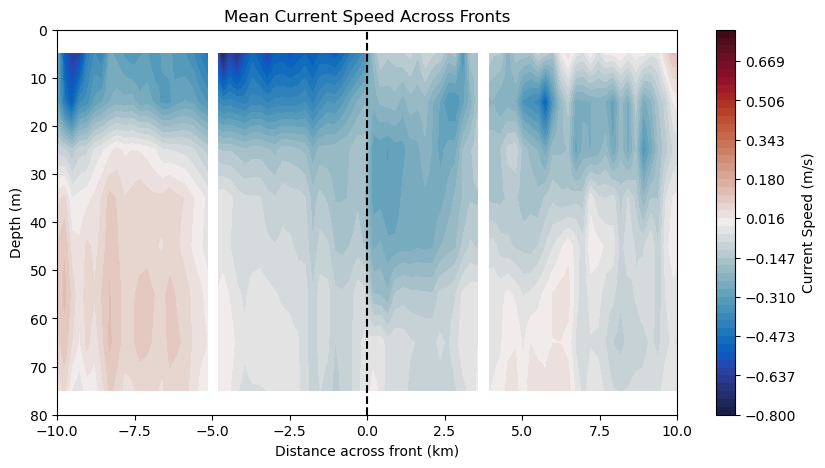

In [725]:
# Compute mean current speed profile
mean_curr_spd = np.array([np.nanmean(depth_range_composites[name], axis=0) for name in depth_names])

# Create distance axis
all_dist_km = np.linspace(-10, 10, mean_curr_spd.shape[1])

# Define contour levels
num_levels = 50
vmin, vmax = -0.8,0.8
levels = np.linspace(vmin, vmax, num_levels)

# Plot contour map
plt.figure(figsize=(10, 5))
plt.contourf(all_dist_km, depths, mean_curr_spd, levels=levels, cmap=cmocean.cm.balance)

plt.colorbar(label='Current Speed (m/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(80, 0)  # Flip y-axis (0m at top)
plt.axvline(0, color='k', linestyle='--')
plt.title('Mean Current Speed Across Fronts')
plt.show()

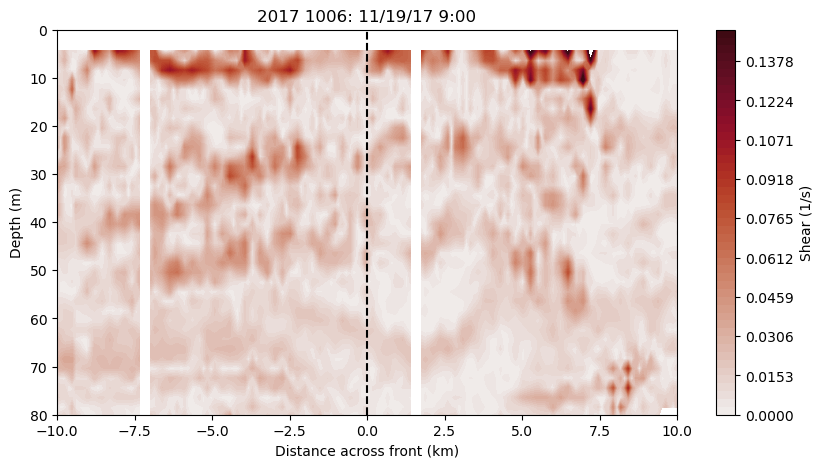

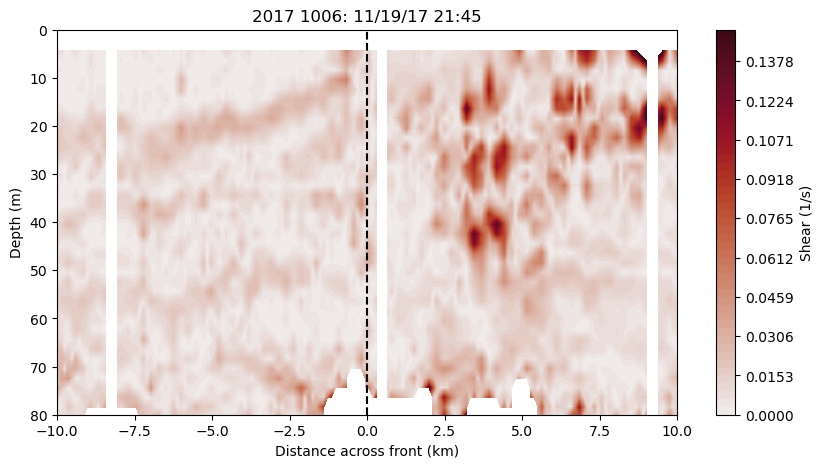

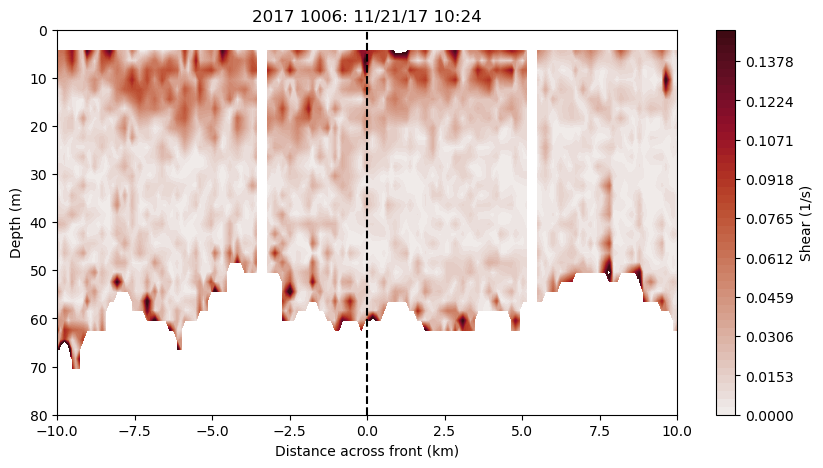

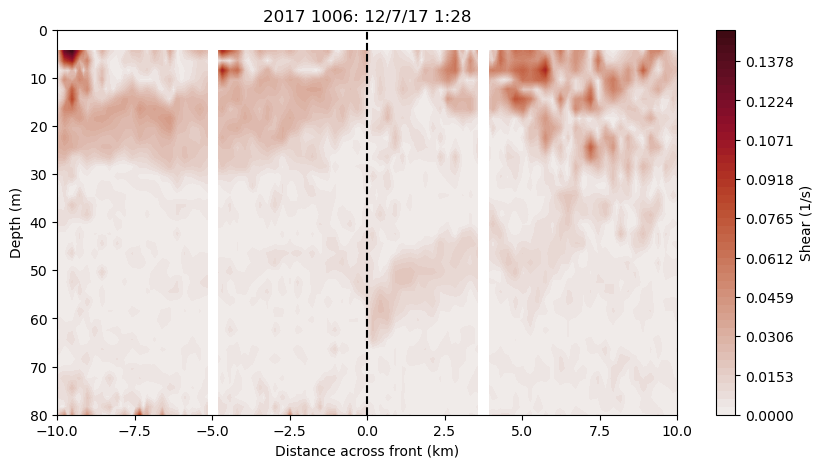

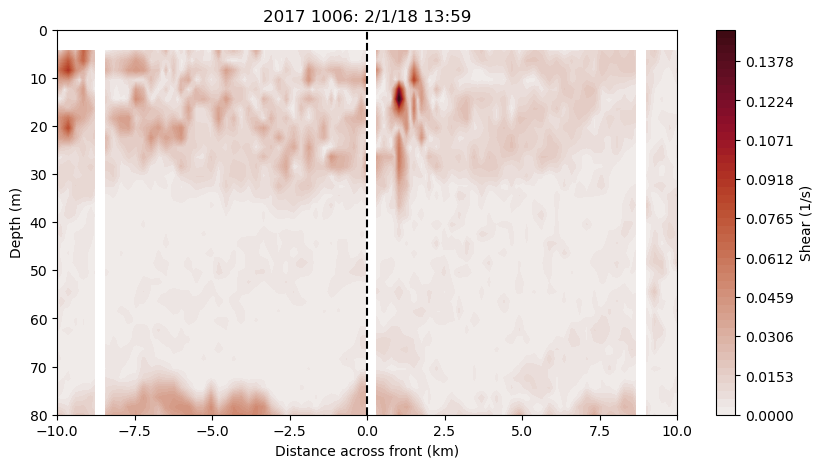

...

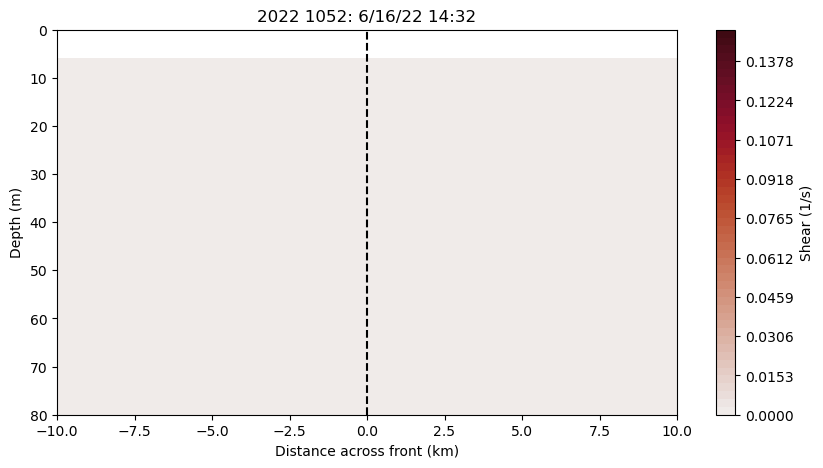

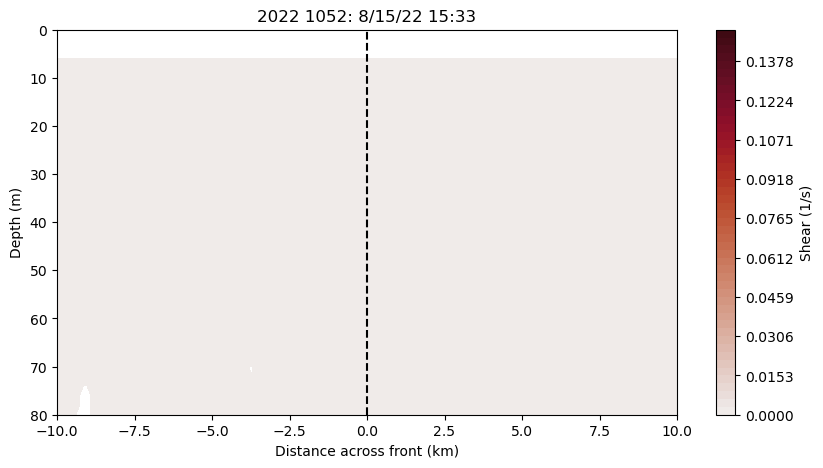

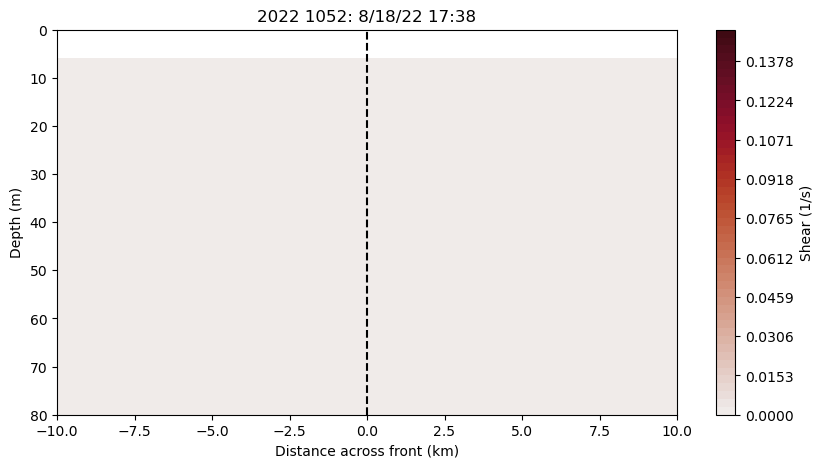

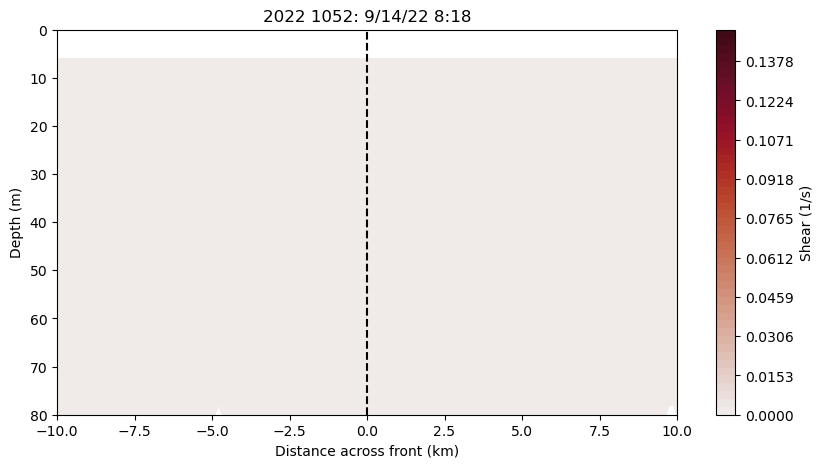

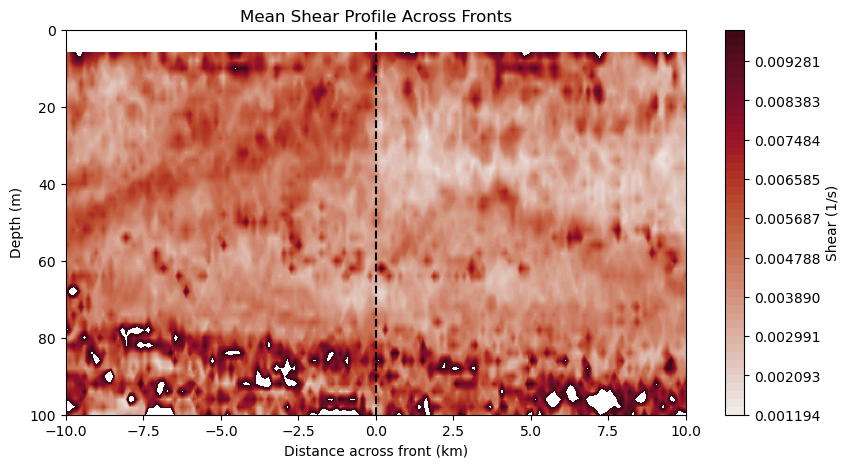

In [679]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from datetime import timedelta
import os

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def compute_shear(U, V, depths):
    dU_dz = np.gradient(U, depths, axis=1)
    dV_dz = np.gradient(V, depths, axis=1)
    shear = np.sqrt(dU_dz**2 + dV_dz**2)
    shear = np.sqrt(dV_dz**2)
    return shear

# Load front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

depth_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80)]

shear_profiles = []

for i in range(len(frontinfo_df)):
    mission = frontinfo_df['Mission'].iloc[i]
    sd = frontinfo_df['SD'].iloc[i]
    front_time = frontinfo_df['time'].iloc[i]
    
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    if not os.path.exists(adcp_file):
        continue
    
    adcp_ds = xr.open_dataset(adcp_file)
    adcp_data = {'time': adcp_ds['time'].values, 'U': adcp_ds['U'].values / 100, 'V': adcp_ds['V'].values / 100, 'depth': adcp_ds['depth'].values}
    
    # Compute shear over the entire dataset first
    U = adcp_data['U']
    V = adcp_data['V']
        
    depths = adcp_data['depth']
    #print(depths)
    shear = compute_shear(U, V, depths)

    # Now slice the section around the front after computing shear
    section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)

    # Flip U and V if frontinfo_df['flip'] == False
    if not frontinfo_df['flip'].iloc[i]:  # Use .iloc[i] for proper indexing
        section['U'] = section['U'][::-1]
        section['V'] = section['V'][::-1]
        shear = shear[::-1]
    
    # Now slice the section around the front after computing shear
    #section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)
    
    # Append shear profile from the section
    # Convert section['time'] to nearest indices
    time_indices = [find_nearest_time_index(adcp_data['time'], t) for t in section['time']]
    shear_section = shear[time_indices, :]

    shear_profiles.append(shear_section)
    distances_km = np.linspace(-10, 10, mean_shear.shape[0])

    # Define contour levels
    num_levels = 50  # Increase this for more contour detail
    vmin, vmax = np.nanmin(mean_shear), 0.15
    levels = np.linspace(vmin, vmax, num_levels)
    
    plt.figure(figsize=(10, 5))
    plt.contourf(distances_km, depths, shear_section.T, levels=levels, cmap=cmocean.cm.amp)
    
    plt.colorbar(label='Shear (1/s)')
    plt.xlabel('Distance across front (km)')
    plt.ylabel('Depth (m)')
    plt.ylim(0,80)
    # Flip the y-axis (surface at top, deeper depths downward)
    plt.gca().invert_yaxis()  # Ensure y-axis is in the correct orientation
    
    plt.title(f'{mission} {sd}: {front_time}')
    plt.axvline(0, color='k', linestyle='--')
    plt.show()


# Compute mean shear profile
mean_shear = np.nanmean(np.array(shear_profiles), axis=0)

distances_km = np.linspace(-10, 10, mean_shear.shape[0])

# Define contour levels
num_levels = 50  # Increase this for more contour detail
vmin, vmax = np.nanmin(mean_shear), 0.01
levels = np.linspace(vmin, vmax, num_levels)

plt.figure(figsize=(10, 5))
plt.contourf(distances_km, depths, mean_shear.T, levels=levels, cmap=cmocean.cm.amp)

plt.colorbar(label='Shear (1/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(0,100)
# Flip the y-axis (surface at top, deeper depths downward)
plt.gca().invert_yaxis()  # Ensure y-axis is in the correct orientation

plt.title('Mean Shear Profile Across Fronts')
plt.axvline(0, color='k', linestyle='--')
plt.show()


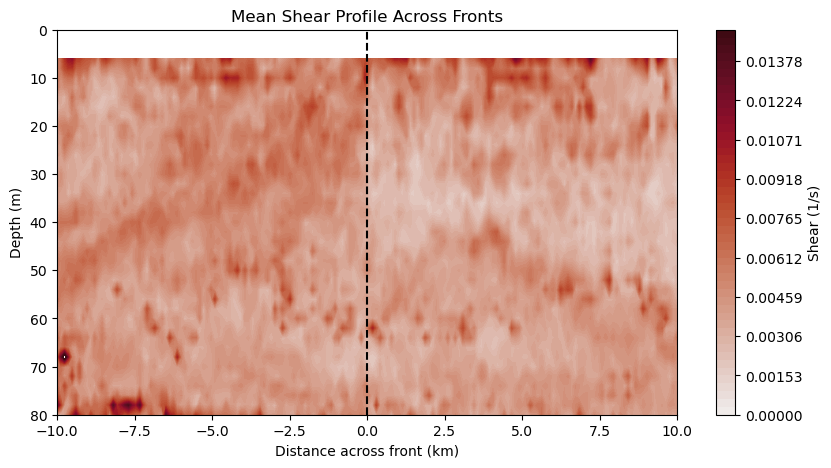

In [680]:
# Compute mean shear profile
mean_shear = np.nanmean(np.array(shear_profiles), axis=0)

distances_km = np.linspace(-10, 10, mean_shear.shape[0])

# Define contour levels
num_levels = 50  # Increase this for more contour detail
vmin, vmax = 0, 0.015
levels = np.linspace(vmin, vmax, num_levels)

plt.figure(figsize=(10, 5))
plt.contourf(distances_km, depths, mean_shear.T, levels=levels, cmap=cmocean.cm.amp)

plt.colorbar(label='Shear (1/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(0,80)
# Flip the y-axis (surface at top, deeper depths downward)
plt.gca().invert_yaxis()  # Ensure y-axis is in the correct orientation

plt.title('Mean Shear Profile Across Fronts')
plt.axvline(0, color='k', linestyle='--')
plt.show()


In [631]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from datetime import timedelta
import os

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def compute_shear(U, V, depths):
    dU_dz = np.gradient(U, depths, axis=1)
    dV_dz = np.gradient(V, depths, axis=1)
    shear = np.sqrt(dU_dz**2 + dV_dz**2)
    return shear

# Load front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

depth_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80)]
#depth_ranges = [(0, 20), (20, 40), (40, 60), (60, 80)]
depth_range_names = [f"{d1}-{d2}m" for d1, d2 in depth_ranges]  # For legend labels

depth_range_composites = {name: [] for name in depth_range_names}  # Dictionary to store depth-bin composites

for i in range(len(frontinfo_df)):
    mission = frontinfo_df['Mission'].iloc[i]
    sd = frontinfo_df['SD'].iloc[i]
    front_time = frontinfo_df['time'].iloc[i]
    
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    if not os.path.exists(adcp_file):
        continue
    
    adcp_ds = xr.open_dataset(adcp_file)
    adcp_data = {'time': adcp_ds['time'].values, 'U': adcp_ds['U'].values / 100, 'V': adcp_ds['V'].values / 100, 'depth': adcp_ds['depth'].values}
    
    U = adcp_data['U']
    V = adcp_data['V']
    depths = adcp_data['depth']

    shear = compute_shear(U, V, depths)

    # Now slice the section around the front after computing shear
    section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)

    if not frontinfo_df['flip'].iloc[i]:  # Correct indexing
        section['U'] = section['U'][::-1]
        section['V'] = section['V'][::-1]
        shear = shear[::-1]

    # Convert section['time'] to nearest indices
    time_indices = [find_nearest_time_index(adcp_data['time'], t) for t in section['time']]
    shear_section = shear[time_indices, :]

    # Bin shear into 10m depth bins
    for (d1, d2), depth_name in zip(depth_ranges, depth_range_names):
        mask = (depths >= d1) & (depths < d2)
        if np.any(mask):
            avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Average across depth bin
            depth_range_composites[depth_name].append(avg_shear)

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2904106566.py:77: RuntimeWarning: Mean of empty slice
  avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Average across depth bin
/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2904106566.py:77: RuntimeWarning: Mean of empty slice
  avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Average across depth bin
/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2904106566.py:77: RuntimeWarning: Mean of empty slice
  avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Average across depth bin
/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2904106566.py:77: RuntimeWarning: Mean of empty slice
  avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Average across depth bin
/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/2904106566.py:77: RuntimeWarning: Mean of empty slice
  avg_shear = np.nanmean(shear_section[:, mask], axis=1)  # Avera

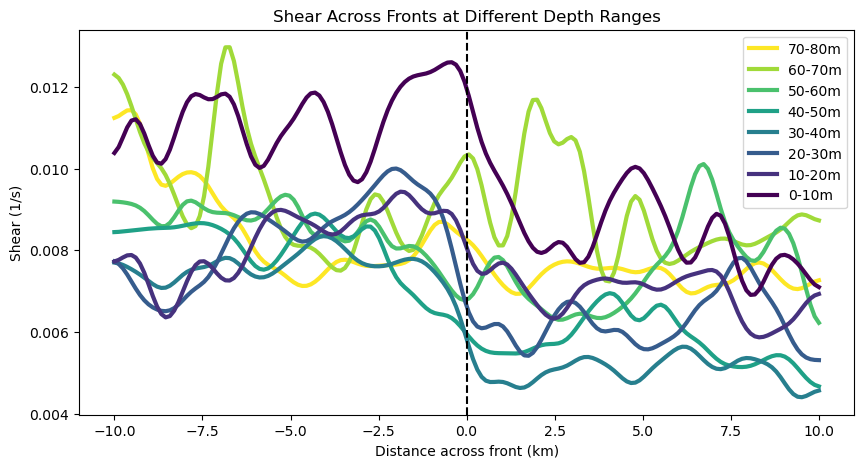

In [632]:
# Define a moving average function
def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='same')

# Compute mean shear profiles for each depth bin
all_dist_km = np.linspace(-10, 10, len(depth_range_composites[depth_range_names[0]][0]))  # Distance axis

# Define colors for depth bins
colors = plt.cm.viridis(np.linspace(0, 1, len(depth_range_names)))  # Spring colormap

# Plot all depth range composites
plt.figure(figsize=(10, 5))
for idx, depth_name in reversed(list(enumerate(depth_range_names))):  # Reverse to plot deeper first
    if depth_range_composites[depth_name]:
        composite_shear = np.nanmean(depth_range_composites[depth_name], axis=0)  # Average across fronts
        
        # Apply moving average smoothing
        composite_shear_ma = moving_average(composite_shear, window_size=1)
        
        # Apply Gaussian smoothing
        composite_shear_smooth = gaussian_filter1d(composite_shear_ma, sigma=3)
        
        plt.plot(all_dist_km, composite_shear_smooth, label=f'{depth_name}', color=colors[idx], linewidth=3)

plt.axvline(0, color='k', linestyle='--')
plt.xlabel('Distance across front (km)')
plt.ylabel('Shear (1/s)')
plt.legend()
plt.title('Shear Across Fronts at Different Depth Ranges')
plt.show()


In [610]:
np.shape(shear)

(74564, 50)

In [607]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from datetime import timedelta
import os

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def compute_shear(U, V, depths):
    dU_dz = np.gradient(U, depths, axis=1)
    dV_dz = np.gradient(V, depths, axis=1)
    shear = np.sqrt(dU_dz**2 + dV_dz**2)
    return shear

# Load front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

depth_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80)]
depth_bin_centers = [(d1 + d2) / 2 for d1, d2 in depth_ranges]  # Midpoint for plotting

shear_profiles = []

for i in range(len(frontinfo_df)):
    mission = frontinfo_df['Mission'].iloc[i]
    sd = frontinfo_df['SD'].iloc[i]
    front_time = frontinfo_df['time'].iloc[i]
    
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    if not os.path.exists(adcp_file):
        continue
    
    adcp_ds = xr.open_dataset(adcp_file)
    adcp_data = {'time': adcp_ds['time'].values, 'U': adcp_ds['U'].values / 100, 'V': adcp_ds['V'].values / 100, 'depth': adcp_ds['depth'].values}
    
    U = adcp_data['U']
    V = adcp_data['V']
    depths = adcp_data['depth']

    shear = compute_shear(U, V, depths)

    # Now slice the section around the front after computing shear
    section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)

    if not frontinfo_df['flip'].iloc[i]:  # Flip U and V if needed
        section['U'] = section['U'][::-1]
        section['V'] = section['V'][::-1]

    # Convert section['time'] to nearest indices
    time_indices = [find_nearest_time_index(adcp_data['time'], t) for t in section['time']]
    shear_section = shear[time_indices, :]

    # Bin shear into 10m depth bins
    binned_shear = []
    for d1, d2 in depth_ranges:
        mask = (depths >= d1) & (depths < d2)
        if np.any(mask):
            binned_shear.append(np.nanmean(shear_section[:, mask], axis=1))  # Average across depth bin
        else:
            binned_shear.append(np.nan)

    shear_profiles.append(np.nanmean(np.array(binned_shear), axis=1))  # Average across time

# Compute mean shear profile
mean_shear_profile = np.nanmean(shear_profiles, axis=0)

# Plot the composite profile
plt.figure(figsize=(5, 8))
plt.plot(shear_profiles, depth_bin_centers, marker='o', linestyle='-')
plt.xlabel('Mean Shear (1/s)')
plt.ylabel('Depth (m)')
plt.gca().invert_yaxis()  # Ensure y-axis is in the correct orientation
plt.title('Depth-Binned Composite Shear Profile')
plt.grid()
plt.show()


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

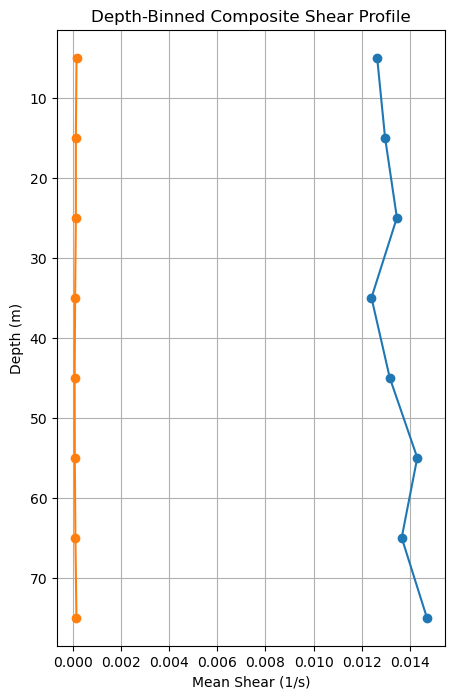

In [604]:
# Compute mean shear profile
mean_shear_profile = np.nanmean(shear_profiles[1:17], axis=0)

# Plot the composite profile
plt.figure(figsize=(5, 8))
plt.plot(np.nanmean(shear_profiles[1:17], axis=0), depth_bin_centers, marker='o', linestyle='-')
plt.plot(np.nanmean(shear_profiles[18:34], axis=0), depth_bin_centers, marker='o', linestyle='-')
plt.xlabel('Mean Shear (1/s)')
plt.ylabel('Depth (m)')
plt.gca().invert_yaxis()  # Ensure y-axis is in the correct orientation
plt.title('Depth-Binned Composite Shear Profile')
plt.grid()
plt.show()


(16, 8)

## divergence across all adco dapta

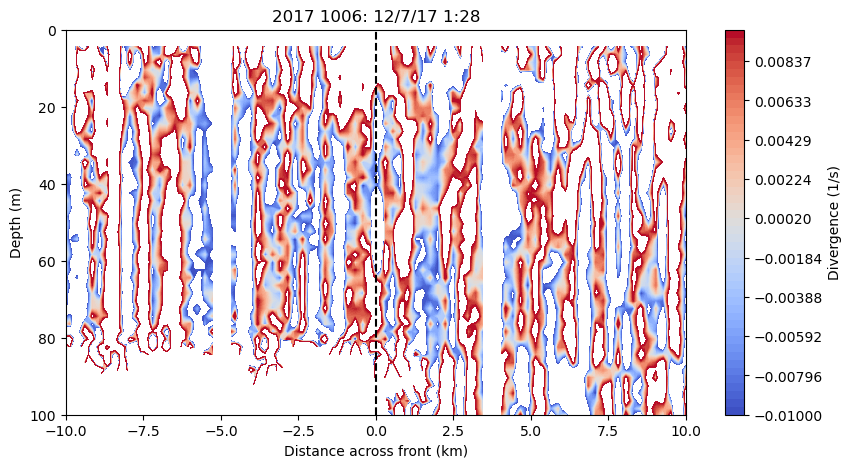

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/3602124230.py:77: RuntimeWarning: Mean of empty slice
  mean_divergence = np.nanmean(np.array(divergence_profiles), axis=0)


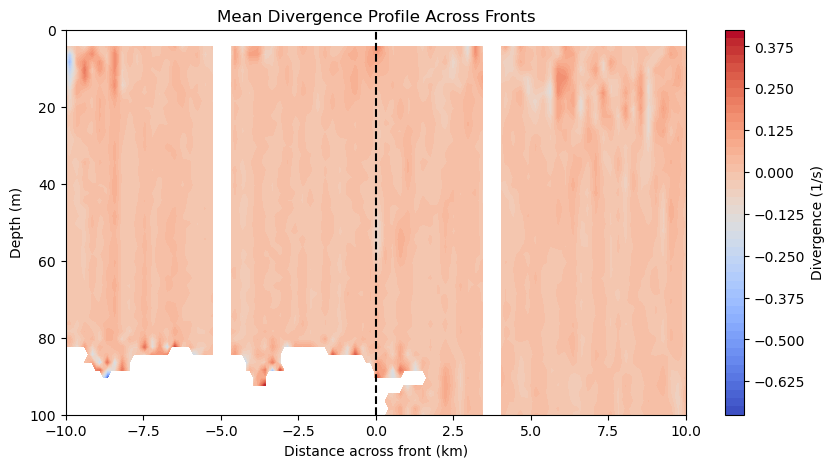

In [726]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from datetime import timedelta
import os

def find_nearest_time_index(times, target_time):
    times = pd.to_datetime(times)
    target_time = pd.to_datetime(target_time)
    return np.argmin(np.abs(times - target_time))

def slice_around_front(data, front_time, distance_km=10, speed_mps=2.0):
    front_index = find_nearest_time_index(data['time'], front_time)
    meters_per_km = 1000
    seconds_per_km = meters_per_km / speed_mps
    time_window_seconds = distance_km * seconds_per_km
    time_window_indices = int(time_window_seconds / 60)

    start_idx = max(0, front_index - time_window_indices)
    end_idx = min(len(data['time']), front_index + time_window_indices)

    section = {key: data[key][start_idx:end_idx] for key in data}
    return section

def compute_divergence(U, V, dx_km):
    dU_dx = np.gradient(U, dx_km, axis=0)
    dV_dy = np.gradient(V, dx_km, axis=0)  # Approximate dy with dx
    divergence = dU_dx + dV_dy
    return divergence

# Load front info DataFrame
frontinfo_df = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase_flipflag.csv')
frontinfo_df = frontinfo_df[frontinfo_df['manual_QC'] == 0]

divergence_profiles = []

for i in range(3,4):#len(frontinfo_df)):
    mission = frontinfo_df['Mission'].iloc[i]
    sd = frontinfo_df['SD'].iloc[i]
    front_time = frontinfo_df['time'].iloc[i]
    
    adcp_file = f'/Volumes/external/TIW/data/saildrone/processed_adcp/{mission}_SD{sd}_adcp_10min.nc'
    if not os.path.exists(adcp_file):
        continue
    
    adcp_ds = xr.open_dataset(adcp_file)
    adcp_data = {'time': adcp_ds['time'].values, 'U': adcp_ds['U'].values / 100, 'V': adcp_ds['V'].values / 100, 'depth': adcp_ds['depth'].values}
    
    # Compute divergence
    U = adcp_data['U']
    V = adcp_data['V']
    dx_km = 1.0  # Approximate spatial resolution in km
    divergence = compute_divergence(U, V, dx_km)

    # Slice around the front
    section = slice_around_front(adcp_data, front_time, distance_km=10, speed_mps=2.0)
    time_indices = [find_nearest_time_index(adcp_data['time'], t) for t in section['time']]
    divergence_section = divergence[time_indices, :]

    divergence_profiles.append(divergence_section)
    distances_km = np.linspace(-10, 10, divergence_section.shape[0])

    # Plot individual divergence profiles
    plt.figure(figsize=(10, 5))
    plt.contourf(distances_km, adcp_data['depth'], divergence_section.T, levels=np.linspace(-0.01,0.01,50), cmap='coolwarm')
    plt.colorbar(label='Divergence (1/s)')
    plt.xlabel('Distance across front (km)')
    plt.ylabel('Depth (m)')
    plt.ylim(0, 100)
    plt.gca().invert_yaxis()
    plt.title(f'{mission} {sd}: {front_time}')
    plt.axvline(0, color='k', linestyle='--')
    plt.show()

# Compute mean divergence profile
mean_divergence = np.nanmean(np.array(divergence_profiles), axis=0)

distances_km = np.linspace(-10, 10, mean_divergence.shape[0])

plt.figure(figsize=(10, 5))
plt.contourf(distances_km, adcp_data['depth'], mean_divergence.T, levels=50, cmap='coolwarm')
plt.colorbar(label='Divergence (1/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(0, 100)
plt.gca().invert_yaxis()
plt.title('Mean Divergence Profile Across Fronts')
plt.axvline(0, color='k', linestyle='--')
plt.show()

/var/folders/kp/k4k3ytr53rb5v8r9c02hm7ch0000gn/T/ipykernel_45697/416188994.py:2: RuntimeWarning: Mean of empty slice
  mean_divergence = np.nanmean(np.array(divergence_profiles), axis=0)


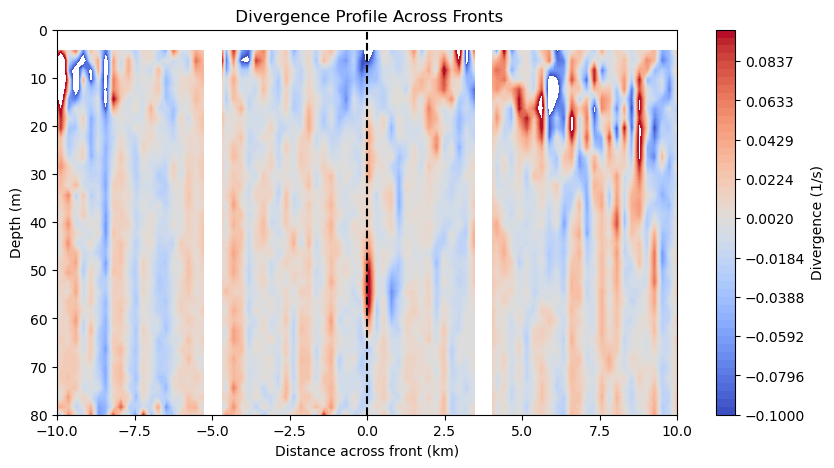

In [732]:
# Compute mean divergence profile
mean_divergence = np.nanmean(np.array(divergence_profiles), axis=0)

distances_km = np.linspace(-10, 10, mean_divergence.shape[0])

plt.figure(figsize=(10, 5))
plt.contourf(distances_km, adcp_data['depth'], -mean_divergence.T, levels=np.linspace(-0.1,0.1,50), cmap='coolwarm')
plt.colorbar(label='Divergence (1/s)')
plt.xlabel('Distance across front (km)')
plt.ylabel('Depth (m)')
plt.ylim(0, 80)
plt.gca().invert_yaxis()
plt.title(' Divergence Profile Across Fronts')
plt.axvline(0, color='k', linestyle='--')
plt.show()

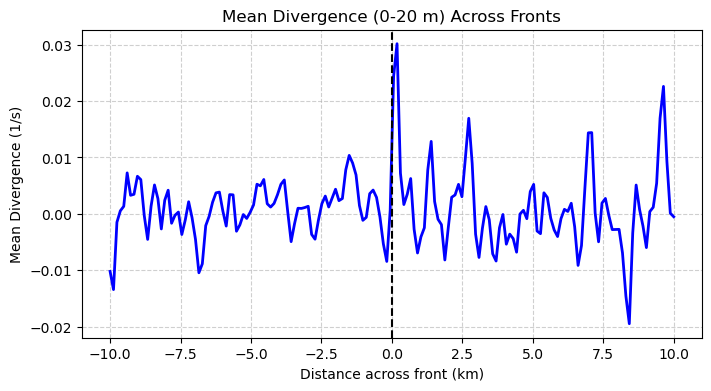

In [661]:
# Define the depth range for averaging
depth_min, depth_max = 0, 20

# Find indices corresponding to the depth range
depth_indices = np.where((depths >= depth_min) & (depths <= depth_max))[0]

# Compute mean divergence over the depth range
mean_divergence_0_20m = np.nanmean(mean_divergence[:, depth_indices], axis=1)

# Plot the mean divergence as a function of distance across the front
plt.figure(figsize=(8, 4))
plt.plot(distances_km, mean_divergence_0_20m, color='b', linewidth=2)

plt.axvline(0, color='k', linestyle='--')  # Mark the front location
plt.xlabel('Distance across front (km)')
plt.ylabel('Mean Divergence (1/s)')
plt.title('Mean Divergence (0-20 m) Across Fronts')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()
